# 数据导入、处理

In [1]:
import numpy as np
import pandas as pd
import scipy as sp
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
%matplotlib inline
import scipy.stats as stats   
import scipy.cluster.vq
import datetime
import os
pd.set_option('display.width', 200)

tw_span = 5.0   #定义时间窗大小（分钟数）
dir_path = os.path.dirname(os.getcwd())
os.chdir(dir_path+'/info')
#载入ap点位
ap = pd.read_csv('AP.csv', encoding='gbk')
ap.location = ap.location.astype(str)
#不同区域的代码
area = pd.read_csv('area.csv', encoding='gbk')
area.area = area.area.astype(str)
ap = pd.merge(ap, area).sort_values('ap_seq')
ap_reduce = ap.loc[:,['ap_seq','area_id']]

#import经过整理的vendor
vendor = pd.read_csv('oui.csv', encoding='gbk')
vendor.columns = ['mac6', 'vendor']
vendor['vendor'] = vendor.vendor.str.replace('"', '')
vendor['mac6'] = vendor.mac6.str.upper()
v_names = ['Apple', 'Xiaomi', 'Samsung', 'Huawei', 'Motorola', 'Microsoft', 'Oppo', 'H3C', 'Aruba', 'TP-LINK', 'D-Link', 'zte',
           'Murata', 'MEIZU', 'Intel', 'vivo', 'Hon Hai', 'HTC', 'Lenovo Mobile', 'Cisco', 'Ereneben', 'AzureWave', 'ASUSTek',
           'Sony Mobile', 'Liteon', 'LG Electronics', 'Nokia', 'Amazon', 'OnePlus', 'SYNTECH (HK)', 'Gionee', 'Smartisan', 'BBK',
           'Yulong', 'Qiku', 'Hisense', 'Tenda', 'Jing Ren', 'Wistron', 'Doukan', 'InPro', 'Dell', 'Net Com', 'Bilian', 'EASY3CALL',
           'Lemobile', 'Airgo', 'Wingtech', 'Paragon', 'Ruckus Wireless', 'RF-LINK', 'Le Shi Zhi Xin', 'Hui Zhou Gaoshengda', 
           'HIWIFI', 'Chicony', 'Beijing SHENQI', 'SYNTECH', 'AMPAK', 'private', 'LONGCHEER', 'TCT']
for name in v_names:
    vendor['vendor'] = np.where(vendor.vendor.str.contains(name, case=False), name, vendor.vendor)
'''
device_name = ['H3C', 'Aruba', 'TP-LINK', 'D-Link', 'Intel', 'Hon Hai', 'Cisco', 'AzureWave', 'Liteon', 
               'SYNTECH (HK)', 'Tenda', 'Jing Ren', 'Wistron', 'Doukan', 'InPro', 'Net Com', 'Bilian', 'EASY3CALL',
                'Lemobile', 'Airgo', 'Wingtech', 'Paragon', 'Ruckus Wireless', 'RF-LINK', 'Le Shi Zhi Xin', 'Hui Zhou Gaoshengda',
                'HIWIFI', 'Chicony', 'Beijing SHENQI', 'SYNTECH', 'AMPAK', 'private']
'''
mobile_name = ['Apple', 'Murata', 'Xiaomi', 'Huawei', 'Samsung', 'Oppo', 'vivo', 'MEIZU', 'Yulong', 'zte', 
               'Sony Mobile', 'BBK', 'Lenovo Mobile', 'HTC', 'Smartisan', 'LG Electronics', 'Qiku', 'Microsoft', 'Gionee', 
               'TCT', 'OnePlus', 'LONGCHEER', 'Hisense', 'Motorola', 'Nokia']
vendor['mobile']=np.where(vendor.vendor.isin(mobile_name), True, False)

/Users/zhangyu/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:37: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.


In [2]:
#载入数据
files = os.listdir(dir_path+'/CleanData')
data = []
fileMax = 100
fileCnt = 0
for datafile in files:
    path = dir_path + '/CleanData/' + datafile
    frame = pd.read_csv(path, encoding='gbk')                 
    data.append(frame)
    fileCnt += 1
    if fileCnt >= fileMax:
        break
data = pd.concat(data, ignore_index = False)
data['date'] = pd.to_datetime(data.date)
data['tw_all'] = ((data.date-data.date.min())/pd.Timedelta(days=1)*(24*60/tw_span)+data.tw).astype(int)
del data['Unnamed: 0']
data['mac6'] = data.mac.str[:6]
data = pd.merge(data, vendor, on='mac6')
data = pd.merge(data, ap_reduce, on='ap_seq')
s = ['2','6','A','E']
data['randMac'] = data.mac.str[1].isin(s)
m_data = data[data.mobile==True]

In [3]:
#去掉只在新国线或索道下站出现的mac (mac数量从184016下降到151251)
temp = m_data[m_data.ap_seq.isin([1,2,3,14,15,18])==False]
mac = temp.groupby(['mac','date']).apply(len).reset_index(name='cnt').groupby('mac').apply(len).reset_index(name='day_cnt')
location = temp.groupby(['mac','ap_seq']).apply(len).reset_index(name='cnt').groupby('mac').apply(len).reset_index(name='location_cnt')
mac = pd.merge(mac, location, on='mac')
g_data = m_data[m_data.mac.isin(mac.mac)]
g_data['weekday'] = g_data.date.dt.weekday < 5
g_data = g_data.sort_values(['mac','tw_all'])

/Users/zhangyu/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys


In [4]:
#去掉工作人员
data_temp = g_data.groupby(['mac','date']).apply(len).reset_index()
data_temp = data_temp.groupby('mac').apply(len).reset_index(name='cnt')
staff = data_temp[data_temp.cnt > 7]
staff_mac = staff.mac
g_data = g_data[g_data.mac.isin(staff_mac) == False]

In [5]:
def festival(frame):
    if (frame.date.iloc[0] > pd.to_datetime('2017-01-26 00:00:00')) and (frame.date.iloc[0] < pd.to_datetime('2017-02-03 00:00:00')):
        frame['festival'] = True
    else:
        frame['festival'] = False
    return frame
g_data = g_data.groupby('date').apply(festival)

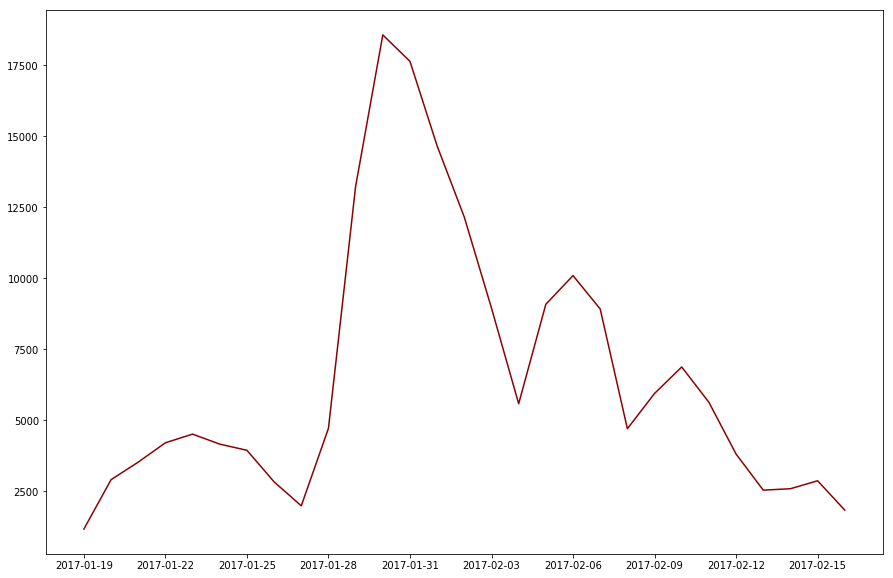

In [6]:
day_cnt = g_data.groupby(['mac','date']).apply(len).reset_index(name='cnt').groupby('date').apply(len).reset_index(name='date_cnt')
fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(1,1,1)
ax.plot(day_cnt.date, day_cnt.date_cnt, c='darkred')

In [7]:
def dateLength(frame):
    frame['date_s'] = (frame.date.max() - frame.date.min())/pd.Timedelta('1d') + 1
    return frame
g_data = g_data.groupby('mac').apply(dateLength).reset_index(drop=True)
data_s = []
data_temp = g_data[g_data.festival == True]
data_temp = data_temp.groupby(['mac','date_s']).apply(len).reset_index(name='cnt').groupby('date_s').apply(len).reset_index(name='cnt')
data_temp.cnt = data_temp.cnt/data_temp.cnt.sum()
data_s.append(data_temp.cnt.iloc[0])
data_s.append(1 - data_temp.cnt.iloc[0])
data_temp = g_data[g_data.festival == False]
data_temp = data_temp.groupby(['mac','date_s']).apply(len).reset_index(name='cnt').groupby('date_s').apply(len).reset_index(name='cnt')
data_temp.cnt = data_temp.cnt/data_temp.cnt.sum()
data_s.append(data_temp.cnt.iloc[0])
data_s.append(1 - data_temp.cnt.iloc[0])

[Text(0,0,'1d'), Text(0,0,'>1d')]

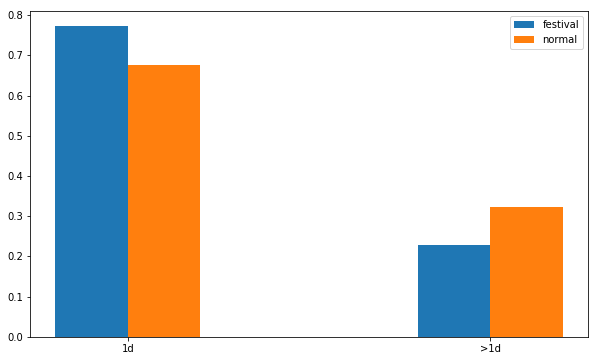

In [8]:
#春节期间待超过一天的人比例更少
fig = plt.figure(figsize=(10,6))
ax = fig.add_subplot(111)
ax.bar(np.arange(0,1,0.5), height=data_s[0:2], width = 0.1, label='festival')
ax.bar(np.arange(0.1,1.1,0.5), height=data_s[2:4], width = 0.1, label='normal')
ax.legend()
ax.set_xticks(np.arange(0.05, 1.05, 0.5))
ax.set_xticklabels(['1d','>1d'])

# 计算点和点之间的gap以及点上停留stay

In [9]:
def area_next(frame):
    frame = frame.sort_values('tw_all')
    frame['area_next'] = frame.area_id.shift(-1)
    frame = frame[frame.area_next != frame.area_id]
    frame['tw_next'] = frame.tw_all.shift(-1)
    return frame
area_flow = g_data.groupby('mac').apply(area_next)
area_flow['gap'] = area_flow.tw_next - area_flow.tw_all

In [10]:
#去除同一个tw里在不同地点有多条记录的mac，大约去除了2000个mac
mac_gap0 = area_flow[area_flow.gap == 0].mac.reset_index(drop=True).drop_duplicates()
area_flow = area_flow[area_flow.mac.isin(mac_gap0) == False]

In [11]:
area_stay = g_data.groupby('area_id').apply(len).reset_index(name='cnt') 
area_stay = pd.merge(area_stay, area, on='area_id')

In [12]:
def flow_next(frame):
    frame = frame.sort_values('tw_all')
    frame['area_next'] = frame.area_id.shift(-1)
    frame['tw_next'] = frame.tw_all.shift(-1)
    return frame
trace_flow = g_data.groupby('mac').apply(flow_next)
trace_flow['gap'] = trace_flow.tw_next - trace_flow.tw_all
trace_flow['duplicate'] = np.abs(trace_flow.area_id.diff(1)).fillna(1) + np.abs(trace_flow.area_next.diff(1)).fillna(1) == 0
trace_flow = trace_flow[trace_flow.duplicate==False]
def trace_gap(frame):
    frame = frame.sort_values('tw_all')
    frame['gap'] = -frame.tw_all.diff(-1)
    return frame
trace_flow = trace_flow.groupby('mac').apply(trace_gap)
trace_flow['duplicate'] = trace_flow.area_id == trace_flow.area_next
trace_flow['stay'] = trace_flow.gap.shift(1) * trace_flow.duplicate.shift(1)
trace_flow = trace_flow[trace_flow.duplicate == False]
#连接到14点
trace_flow.area_next = trace_flow.area_next.fillna(14)

/Users/zhangyu/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:14: FutureWarning: 'mac' is both a column name and an index level.
Defaulting to column but this will raise an ambiguity error in a future version
  


In [13]:
trace_flow.area_id = trace_flow.area_id.replace([0,1,2,3,4,5,6,7,8,9,10,11,12,13],
                           ['0','1','2','3','4','5','6','7','8','9','A','B','C','D'])
trace_flow.area_next = trace_flow.area_next.replace([0,1,2,3,4,5,6,7,8,9,10,11,12,13,14],
                           ['0','1','2','3','4','5','6','7','8','9','A','B','C','D','E'])
trace_flow['area_move'] = trace_flow.area_id + trace_flow.area_next + ','

In [14]:
sixteen = ['0','1','2','3','4','5','6','7','8','9','A','B','C','D']
area_move = [['1','3','8','A'],['0','2','4'],['1','6','8'],['0'],
             ['1','B','D'],['6','7'],['2','5'],['5','9','C'],['0','2'],
             ['7','A'],['0','9'],['4','D'],['7','D'],['4','B','C']]
area_move = pd.Series(area_move).reset_index(name='area_next')
area_move.columns = ['area_seq','area_next']
area_move.area_seq = area_move.area_seq.replace([0,1,2,3,4,5,6,7,8,9,10,11,12,13],
                                                ['0','1','2','3','4','5','6','7','8','9','A','B','C','D'])

# 两点间的gap分布拟合

/Users/zhangyu/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  del sys.path[0]
/Users/zhangyu/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:15: FutureWarning: 'mac' is both a column name and an index level.
Defaulting to column but this will raise an ambiguity error in a future version
  from ipykernel import kernelapp as app


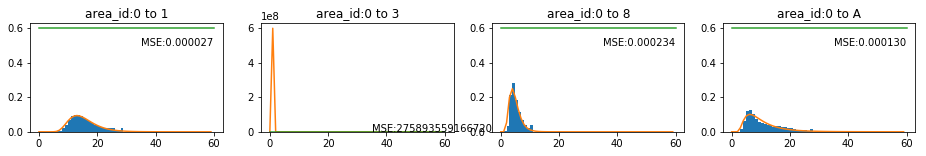

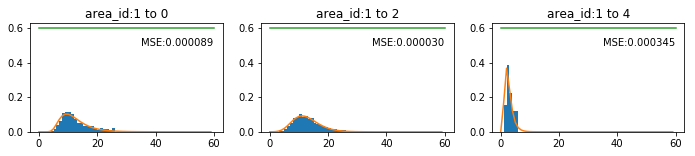

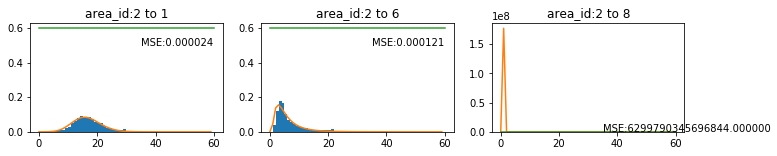

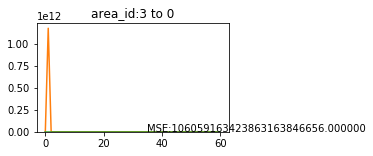

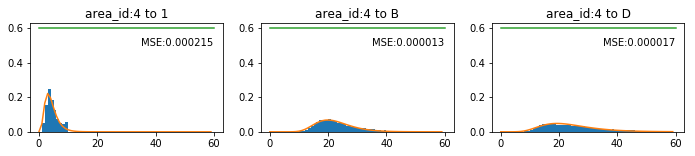

...

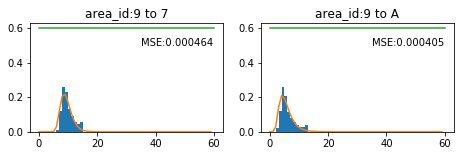

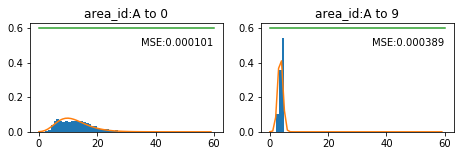

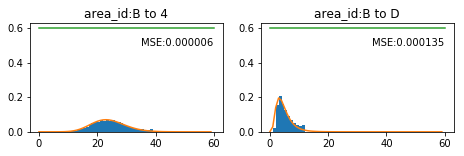

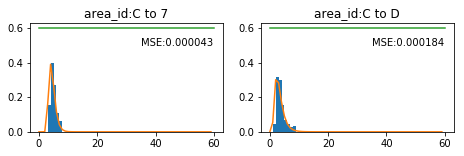

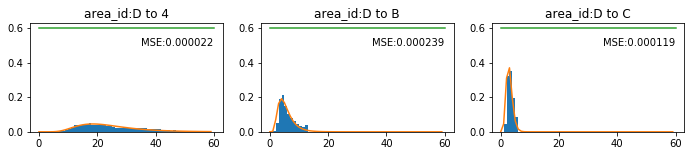

In [12]:
#绘制两点间的gap
#对数正态分布拟合
def mse_communicate(fact, predict):
    m = len(fact)
    mse = ((fact-predict)*(fact-predict)).sum()/m
    return mse

from scipy.stats import lognorm
def draw_gap(area_id, area_next, size = (20,10), twmax=144):
    fig = plt.figure(figsize=size)
    l = len(area_next)
    for i in range(l): 
        gap_temp = trace_flow[trace_flow.area_id == area_id][trace_flow.area_next == area_next[i]]
        gap_temp.fillna(0)
        gap_temp = gap_temp.groupby(['mac','gap']).apply(len).reset_index().sort_values('gap')
        gap_temp = gap_temp[gap_temp.gap < twmax]
        gap_temp = gap_temp[gap_temp.gap > 0]
        
        #去除疑似异常值
        q1 = gap_temp.iloc[int(gap_temp.shape[0]*1/4),1]
        q3 = gap_temp.iloc[int(gap_temp.shape[0]*3/4),1]
        iqr = q3-q1
        gap_temp = gap_temp[gap_temp.gap < q3+1.5*iqr]
        gap_temp = gap_temp[gap_temp.gap > q1-1.5*iqr]
        
        gapmax = int(gap_temp.gap.max()) - int(gap_temp.gap.min())
        ax = fig.add_subplot(l/5 + 1,5,i+1)
        ax.hist(gap_temp.gap, bins=gapmax, normed=True)
        s, u, sigma = lognorm.fit(gap_temp.gap)
        
        fact = gap_temp.groupby('gap').apply(len).reset_index(name = 'feq')
        fact.feq = fact.feq/fact.feq.sum()
        gap = np.arange(int(fact.gap.min()), int(fact.gap.max())+1)
        predict = lognorm.pdf(gap,s,loc=u,scale=sigma)
        
        mse = mse_communicate(fact.feq, predict)
        
        x = np.array(range(60))
        ax.plot(x,lognorm.pdf(x,s,loc=u,scale=sigma))
        ax.plot((0,60),(0.6,0.6))
        ax.text(35,0.5,'MSE:%f'%(mse))
        ax.set_title('area_id:'+str(area_id)+' to '+str(area_next[i]))

for i in range(14):
    draw_gap(area_move.iloc[i,0], area_move.iloc[i,1],size=(20,2),twmax=100)

/Users/zhangyu/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:18: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/Users/zhangyu/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:20: FutureWarning: 'mac' is both a column name and an index level.
Defaulting to column but this will raise an ambiguity error in a future version
/Users/zhangyu/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in true_divide
  # This is added back by InteractiveShellApp.init_path()
/Users/zhangyu/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in log
  # This is added back by InteractiveShellApp.init_path()
/Users/zhangyu/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in multiply
  # This is added back by InteractiveShellApp.init_path()


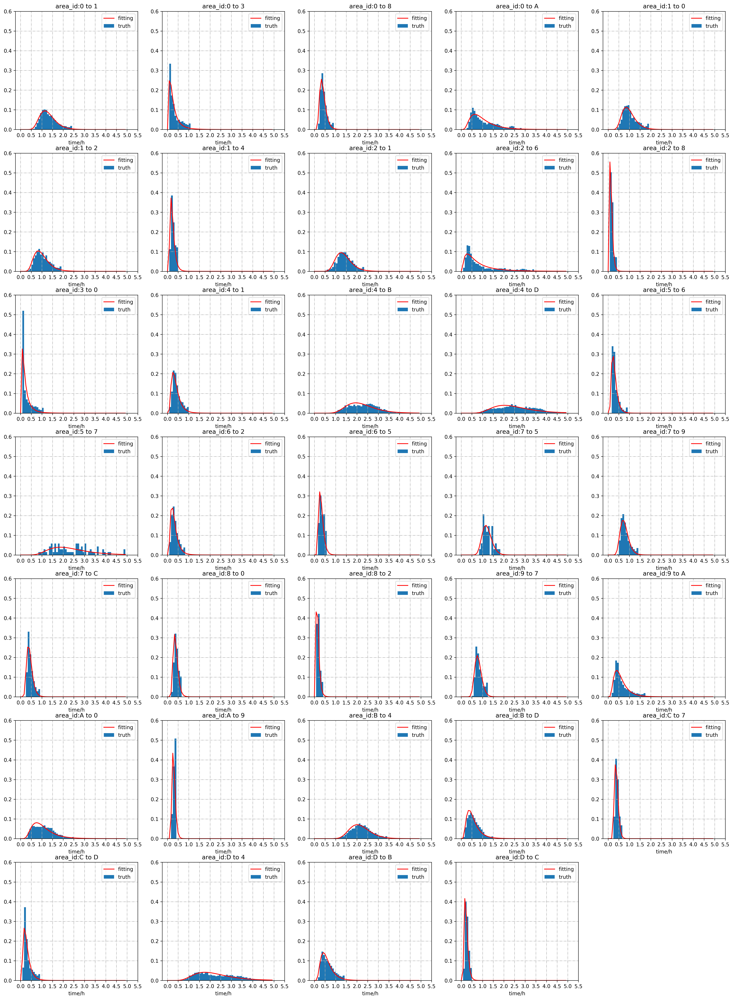

In [15]:
#绘制两点间的gap
#对数正态分布拟合(春节期间)
gap_key_festival = {}
trace_temp = trace_flow[trace_flow.festival == True]
def mse_communicate(fact, predict):
    m = len(fact)
    mse = ((fact-predict)*(fact-predict)).sum()/m
    return mse

def lognorm_pdf(x,u,sigma):
    pdf = 1/(x*sigma*np.sqrt(2*np.pi))*np.exp(-(np.log(x)-u)**2/(2*sigma**2))
    return pdf

from scipy.stats import norm
def draw_gap(fig, area_id, area_next, k, twmax=144):
    l = len(area_next)
    for i in range(l): 
        gap_temp = trace_temp[trace_temp.area_id == area_id][trace_temp.area_next == area_next[i]]
        gap_temp.fillna(0)
        gap_temp = gap_temp.groupby(['mac','gap']).apply(len).reset_index().sort_values('gap')
        gap_temp = gap_temp[gap_temp.gap < twmax]
        gap_temp = gap_temp[gap_temp.gap > 0]
        
        #去除疑似异常值
        q1 = gap_temp.iloc[int(gap_temp.shape[0]*1/4),1]
        q3 = gap_temp.iloc[int(gap_temp.shape[0]*3/4),1]
        iqr = q3-q1
        gap_temp = gap_temp[gap_temp.gap < q3+1.5*iqr]
        gap_temp = gap_temp[gap_temp.gap > q1-1.5*iqr]
        
        gapmax = int(gap_temp.gap.max()) - int(gap_temp.gap.min())
        ax = fig.add_subplot(7,5,k+1)
        ax.hist(gap_temp.gap, bins=gapmax, normed=True, label='truth')
        u, sigma = norm.fit(np.log(gap_temp.gap))
        gap_key_festival[area_id+area_next[i]] = (u, sigma)
        '''
        fact = gap_temp.groupby('gap').apply(len).reset_index(name = 'feq')
        fact.feq = fact.feq/fact.feq.sum()
        gap = np.arange(int(fact.gap.min()), int(fact.gap.max())+1)
        predict = lognorm.pdf(gap,s,loc=u,scale=sigma)
        
        mse = mse_communicate(fact.feq, predict)
        '''
        plt.grid(linestyle='-.')
        x = np.array(range(60))
        ax.plot(x,pd.Series(lognorm_pdf(x,u,sigma)).fillna(0),c='red',label='fitting')
        ax.set_xticks(np.arange(0,72,6))
        ax.set_xticklabels(np.arange(0,6,0.5))
        ax.set_yticks(np.arange(0,0.7,0.1))
        #ax.text(35,0.5,'MSE:%f'%(mse))
        ax.set_title('area_id:'+str(area_id)+' to '+str(area_next[i]))
        ax.set_xlabel('time/h')
        ax.legend()
        k += 1
    return k

fig = plt.figure(figsize=(25,35), dpi=300)
k=0
for i in range(14):
    k = draw_gap(fig,area_move.iloc[i,0],area_move.iloc[i,1],k,twmax=60)
#fig.savefig('/Users/zhangyu/Desktop/HuangShan/picture/7.jpg')

/Users/zhangyu/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':
/Users/zhangyu/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:11: FutureWarning: 'mac' is both a column name and an index level.
Defaulting to column but this will raise an ambiguity error in a future version
  # This is added back by InteractiveShellApp.init_path()
/Users/zhangyu/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in true_divide
  # This is added back by InteractiveShellApp.init_path()
/Users/zhangyu/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in log
  # This is added back by InteractiveShellApp.init_path()
/Users/zhangyu/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in multiply
  # This is added back by I

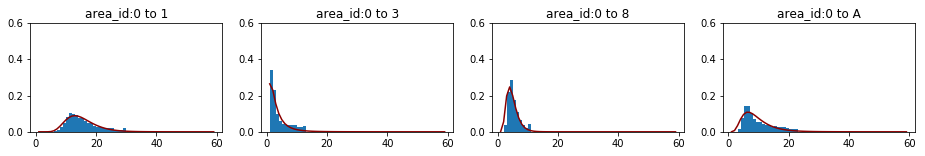

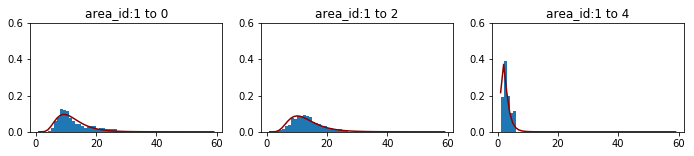

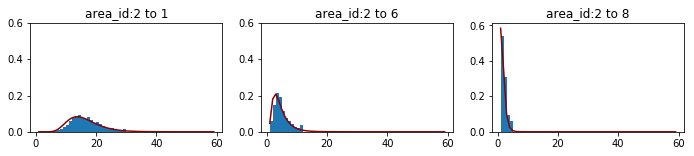

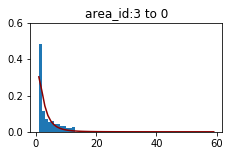

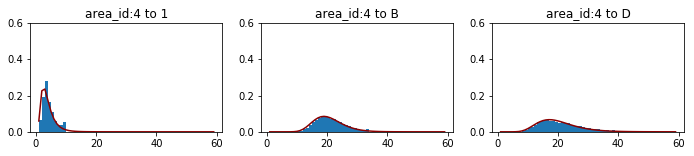

...

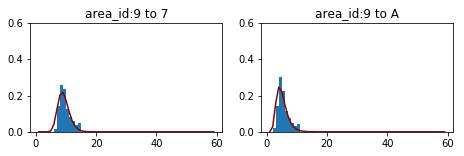

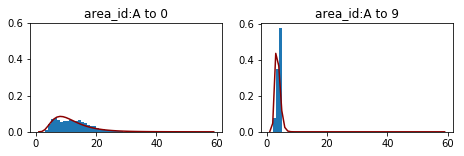

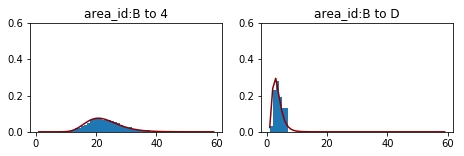

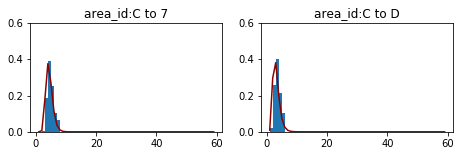

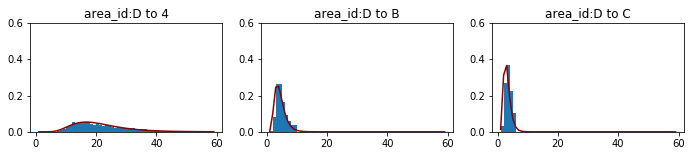

In [16]:
#绘制两点间的gap
#对数正态分布拟合（非春节期间）
gap_key = {}
trace_temp = trace_flow[trace_flow.festival == False]
def draw_gap(area_id, area_next, size = (20,10), twmax=144):
    fig = plt.figure(figsize=size)
    l = len(area_next)
    for i in range(l): 
        gap_temp = trace_temp[trace_temp.area_id == area_id][trace_temp.area_next == area_next[i]]
        gap_temp.fillna(0)
        gap_temp = gap_temp.groupby(['mac','gap']).apply(len).reset_index().sort_values('gap')
        gap_temp = gap_temp[gap_temp.gap < twmax]
        gap_temp = gap_temp[gap_temp.gap > 0]
        
        #去除疑似异常值
        q1 = gap_temp.iloc[int(gap_temp.shape[0]*1/4),1]
        q3 = gap_temp.iloc[int(gap_temp.shape[0]*3/4),1]
        iqr = q3-q1
        gap_temp = gap_temp[gap_temp.gap < q3+1.5*iqr]
        gap_temp = gap_temp[gap_temp.gap > q1-1.5*iqr]
        
        gapmax = int(gap_temp.gap.max()) - int(gap_temp.gap.min())
        ax = fig.add_subplot(l/5 + 1,5,i+1)
        ax.hist(gap_temp.gap, bins=gapmax, normed=True)
        u, sigma = norm.fit(np.log(gap_temp.gap))
        gap_key[area_id+area_next[i]] = (u, sigma)
        '''
        fact = gap_temp.groupby('gap').apply(len).reset_index(name = 'feq')
        fact.feq = fact.feq/fact.feq.sum()
        gap = np.arange(int(fact.gap.min()), int(fact.gap.max())+1)
        predict = lognorm.pdf(gap,s,loc=u,scale=sigma)
        
        mse = mse_communicate(fact.feq, predict)
        '''
        x = np.array(range(60))
        ax.plot(x,lognorm_pdf(x,u,sigma),c='darkred')
        ax.set_xticks(np.arange(0,72,20))
        ax.set_yticks(np.arange(0,0.7,0.2))
        #ax.text(35,0.5,'MSE:%f'%(mse))
        ax.set_title('area_id:'+str(area_id)+' to '+str(area_next[i]))

for i in range(14):
    draw_gap(area_move.iloc[i,0], area_move.iloc[i,1],size=(20,2),twmax=60)

/Users/zhangyu/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in true_divide
  # This is added back by InteractiveShellApp.init_path()
/Users/zhangyu/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in log
  # This is added back by InteractiveShellApp.init_path()
/Users/zhangyu/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in multiply
  # This is added back by InteractiveShellApp.init_path()


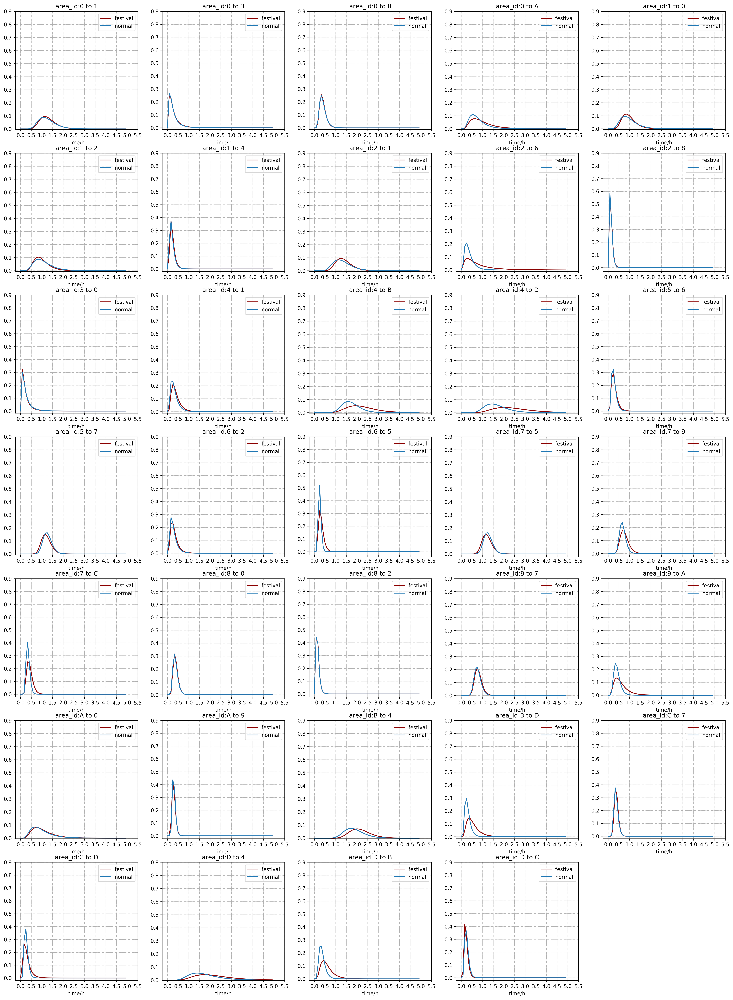

In [17]:
gap_key['57'] = gap_key['75']
gap_key_festival['57'] = gap_key_festival['75']
gapTemp = pd.Series(gap_key).reset_index()
gapTemp.columns = ['area_move','parameter']
gapFes = pd.Series(gap_key_festival).reset_index()
gapFes.columns = ['area_move','parameterFes']
gapFes = pd.merge(gapTemp, gapFes, on='area_move')
del gapTemp
fig = plt.figure(figsize=(25,35),dpi=300)
l = gapFes.shape[0]
for i in range(l):
    ax = fig.add_subplot(7,5,i+1)
    x = np.arange(60)
    u1, sigma1 = gapFes.parameterFes.iloc[i]
    u2, sigma2 = gapFes.parameter.iloc[i]
    ax.plot(x,pd.Series(lognorm_pdf(x,u1,sigma1)).fillna(0),c='darkred',label='festival')
    ax.plot(x,pd.Series(lognorm_pdf(x,u2,sigma2)).fillna(0),label='normal')
    ax.set_title('area_id:'+gapFes.area_move.iloc[i][0]+' to '+gapFes.area_move.iloc[i][1])
    ax.set_xticks(np.arange(0,72,6))
    ax.set_yticks(np.arange(0,1,0.1))
    ax.set_xticklabels(np.arange(0,6,0.5))
    ax.set_xlabel('time/h')
    plt.grid(linestyle='-.')
    ax.legend()
#fig.savefig('/Users/zhangyu/Desktop/HuangShan/picture/8.jpg')

# 点上停留stay拟合

/Users/zhangyu/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':
/Users/zhangyu/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in power
  after removing the cwd from sys.path.


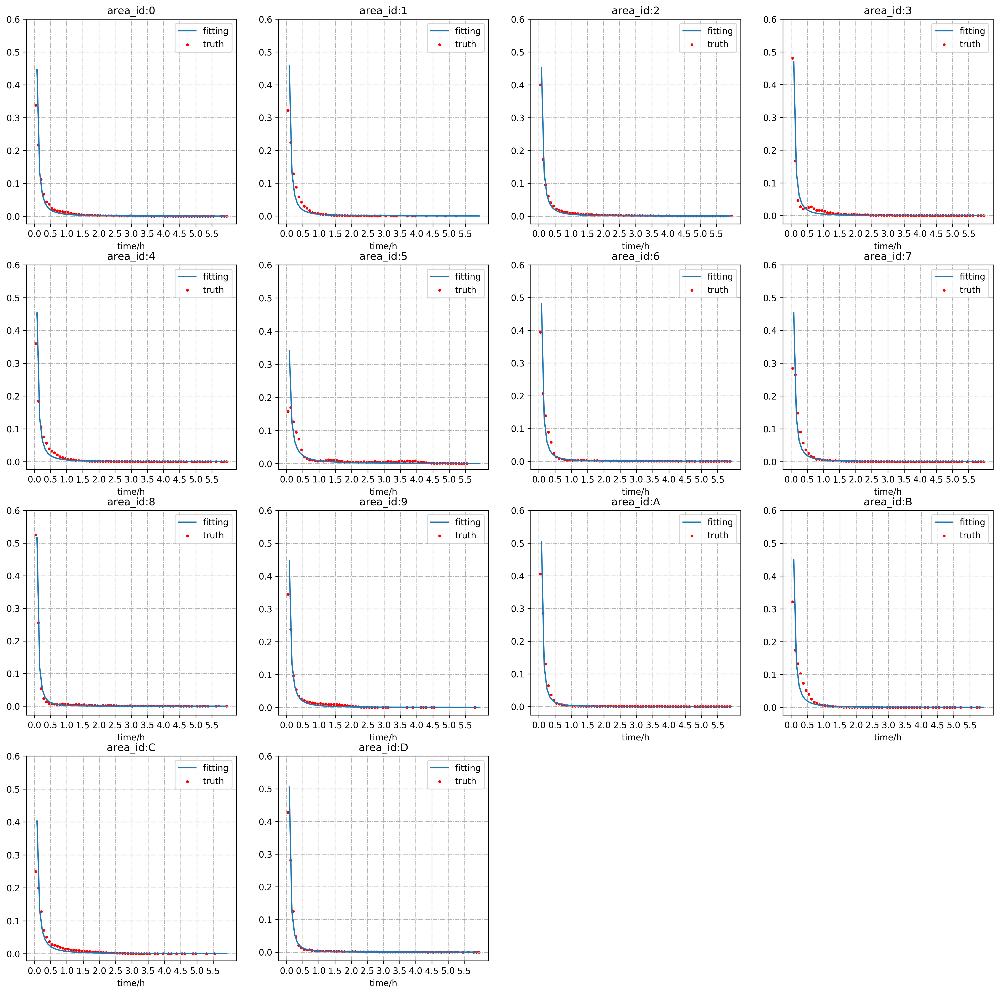

In [18]:
#幂律分布拟合（春节期间）
stay_festival = {}
def power_law(x, xmin, alpha):
    pdf = (alpha-1)/xmin*(x/xmin)**(-alpha)
    return pdf

fig = plt.figure(figsize=(20,20), dpi=300)
for i in range(14):
    trace_temp = trace_flow[trace_flow.festival == True][trace_flow.area_id==sixteen[i]]
    trace_temp = trace_temp[trace_temp.stay < 72]
    trace_temp.sort_values('stay').reset_index(drop=True)
    trace_temp['stay'] = trace_temp.stay + 0.5
    
    stay_temp = trace_temp.groupby('stay').apply(len).reset_index(name='weight')
    stay_temp = stay_temp[['stay','weight']].drop_duplicates()
    stay_temp['weight'] = stay_temp.weight/stay_temp.weight.sum()
    
    sigma =  np.nansum(np.log((trace_temp.stay/0.5).values.astype('float')))
    alpha = 1 + trace_temp.shape[0]*sigma**(-1)
    
    stay_festival[sixteen[i]] = alpha
    
    ax = fig.add_subplot(14/4 + 1,4,i+1)
    #ax.hist(trace_temp.stay, bins=72, normed=True)
    ax.scatter(stay_temp.stay, stay_temp.weight, c='r',s=5, label='truth')
    x = np.arange(72)
    ax.plot(x, power_law(x, 0.5, alpha), label='fitting')
    ax.set_title('area_id:'+sixteen[i])
    ax.set_xticks(np.arange(0,72,6))
    ax.set_yticks(np.arange(0,0.7,0.1))
    ax.set_xticklabels(np.arange(0,6,0.5))
    plt.grid(linestyle='-.')
    ax.legend()
    ax.set_xlabel('time/h')

#fig.savefig('/Users/zhangyu/Desktop/HuangShan/picture/6.jpg')

/Users/zhangyu/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """
/Users/zhangyu/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in power
  after removing the cwd from sys.path.


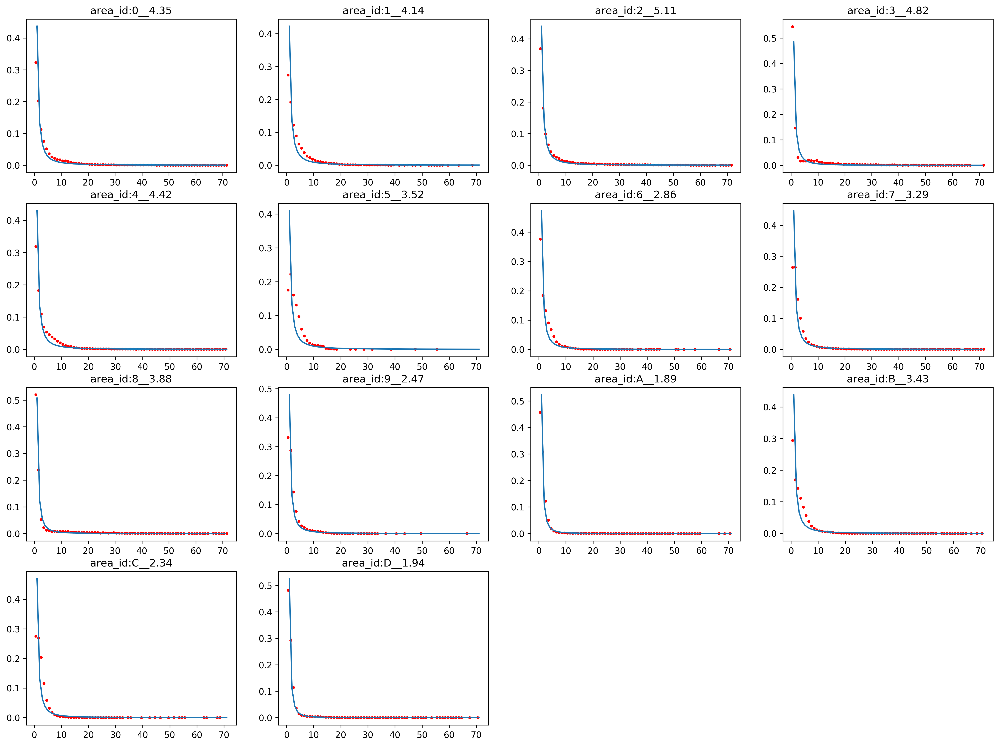

In [19]:
#幂律分布拟合（非春节期间）
stay_key = {}
fig = plt.figure(figsize=(20,15), dpi=300)
for i in range(14):
    trace_temp = trace_flow[trace_flow.festival == False][trace_flow.area_id==sixteen[i]]
    trace_temp = trace_temp[trace_temp.stay < 72]
    trace_temp.sort_values('stay').reset_index(drop=True)
    trace_temp['stay'] = trace_temp.stay + 0.5
    
    stay_temp = trace_temp.groupby('stay').apply(len).reset_index(name='weight')
    stay_temp = stay_temp[['stay','weight']].drop_duplicates()
    stay_temp['weight'] = stay_temp.weight/stay_temp.weight.sum()
    
    sigma =  np.nansum(np.log((trace_temp.stay/0.5).values.astype('float')))
    alpha = 1 + trace_temp.shape[0]*sigma**(-1)
    
    stay_key[sixteen[i]] = alpha
    
    ax = fig.add_subplot(14/4 + 1,4,i+1)
    #ax.hist(trace_temp.stay, bins=72, normed=True)
    ax.scatter(stay_temp.stay, stay_temp.weight, c='r',s=5 )
    x = np.arange(72)
    ax.plot(x, power_law(x, 0.5, alpha))
    ax.set_title('area_id:'+sixteen[i]+'__%.2f'%(trace_temp.stay.mean()))

/Users/zhangyu/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in power
  after removing the cwd from sys.path.


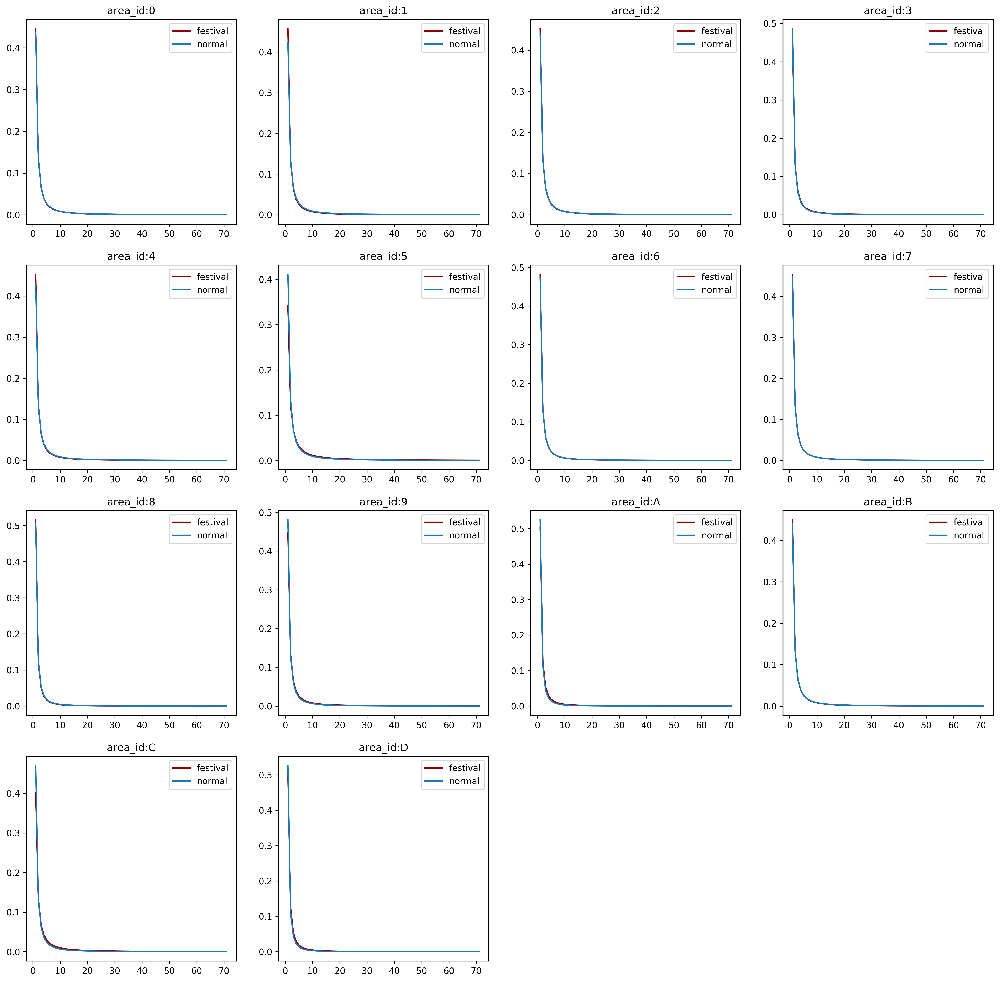

In [20]:
stayFes = pd.merge(pd.Series(stay_festival).reset_index(name='parameterFes'), pd.Series(stay_key).reset_index(name='parameter'))
stayFes.columns = ['area_id','parameterFes','parameter']
fig = plt.figure(figsize=(20,20),dpi=300)
for i in range(14):
    ax = fig.add_subplot(4,4,i+1)
    x = np.arange(72)
    alpha1 = stayFes.parameterFes.iloc[i]
    alpha2 = stayFes.parameter.iloc[i]
    ax.plot(x, power_law(x, 0.5, alpha1),c='darkred',label='festival')
    ax.plot(x, power_law(x, 0.5, alpha2),label='normal')
    ax.set_title('area_id:' + stayFes.area_id.iloc[i])
    ax.legend()

# 缺失值填充

In [21]:
#将连续分布函数概率离散化以便之后卷积
from scipy.integrate import quad
def desperse(parameter, l=50, r=0):
    des_list = []
    if r == 0:
        for i in range(l):
            pdf = quad(lambda x: power_law(x, 0.5, parameter), a=i+0.5, b=i+1.5)[0]
            des_list.append(pdf)
    else:
        des_list.append(0)
        for i in range(l):
            pdf = quad(lambda x: lognorm_pdf(x, parameter[0], parameter[1]), a=i+0.5, b=i+1.5)[0]
            des_list.append(pdf)
    return des_list

gapKey_list = []
gapKey_listFes = []
for i in range(gapFes.shape[0]):
    gapKey_list.append(desperse(gapFes.parameter[i], l=72, r=1))
    gapKey_listFes.append(desperse(gapFes.parameterFes[i], l=72, r=1))
gapFes['des_list'] = gapKey_list
gapFes['des_listFes'] = gapKey_listFes
del gapKey_list
del gapKey_listFes

stayKey_list = []
stayKey_listFes = []
for i in range(stayFes.shape[0]):
    stayKey_list.append(desperse(stayFes.parameter[i], l=72, r=0))
    stayKey_listFes.append(desperse(stayFes.parameterFes[i], l=72, r=0))
stayFes['des_list'] = stayKey_list
stayFes['des_listFes'] = stayKey_listFes
del stayKey_list
del stayKey_listFes

In [23]:
area_lost = pd.read_csv(dir_path+'/info/area_lack.csv')
area_lost.area_lack = area_lost.area_lack.fillna(1)
area_lost = area_lost[['area_move','area_lack','route1','route2','route3','route4','route5','route6']]
area_lost = pd.merge(trace_flow, area_lost, on='area_move')
area_lost = area_lost[['mac','tw','tw_all','date','ap_seq','vendor','mobile',
                       'area_id','area_next','tw_next','gap','stay','area_move',
                       'area_lack','festival','route1','route2','route3','route4','route5','route6']]

area_lost.route1 = area_lost.route1.fillna('0')
area_lost.route2 = area_lost.route2.fillna('0')
area_lost.route3 = area_lost.route3.fillna('0')
area_lost.route4 = area_lost.route4.fillna('0')
area_lost.route5 = area_lost.route5.fillna('0')
area_lost.route6 = area_lost.route6.fillna('0')

def route_change(area_temp):
    route1 = area_temp.route1.reset_index(drop=True)[0]
    route2 = area_temp.route2.reset_index(drop=True)[0]
    route3 = area_temp.route3.reset_index(drop=True)[0]
    route4 = area_temp.route4.reset_index(drop=True)[0]
    route5 = area_temp.route5.reset_index(drop=True)[0]
    route6 = area_temp.route6.reset_index(drop=True)[0]
    if route1[-1] == ',':
        area_temp.route1 = route1[0:-1]
    if route2[-1] == ',':
        area_temp.route2 = route2[0:-1]
    if route3[-1] == ',':
        area_temp.route3 = route3[0:-1]
    if route4[-1] == ',':
        area_temp.route4 = route4[0:-1]
    if route5[-1] == ',':
        area_temp.route5 = route5[0:-1]
    if route6[-1] == ',':
        area_temp.route6 = route6[0:-1]
    return area_temp
        
area_lost = area_lost.groupby('area_move').apply(route_change)

In [24]:
#定义路径gap卷积函数
def trace_convolution(route, festival):
    convolution_list = []
    for i in range(6):
        if route[i] != '0':
            l = len(route[i]) - 1
            convolution_temp = [1]
            for j in range(l):
                gap = route[i][j]+route[i][j+1]
                stay = route[i][j+1]
                if festival:
                    gap = gapFes[gapFes.area_move == gap].des_listFes.iloc[0]
                    stay = stayFes[stayFes.area_id == stay].des_listFes.iloc[0]
                else:
                    gap = gapFes[gapFes.area_move == gap].des_list.iloc[0]
                    stay = stayFes[stayFes.area_id == stay].des_list.iloc[0]
                if j+1 == l:
                    convolution_temp = np.convolve(convolution_temp, gap)
                else:
                    convolution_temp = np.convolve(convolution_temp, gap)
                    convolution_temp = np.convolve(convolution_temp, stay)
            convolution_temp = pd.Series(convolution_temp)
            convolution_list.append(convolution_temp)
        else:
            convolution_list.append(0)           
    return convolution_list

def gap_lack_convolution(area_temp):
    route1 = area_temp.route1.reset_index(drop=True)[0]
    route2 = area_temp.route2.reset_index(drop=True)[0]
    route3 = area_temp.route3.reset_index(drop=True)[0]
    route4 = area_temp.route4.reset_index(drop=True)[0]
    route5 = area_temp.route5.reset_index(drop=True)[0]
    route6 = area_temp.route6.reset_index(drop=True)[0]
    route = [route1,route2,route3,route4,route5,route6]
       
    convolution_list = trace_convolution(route, area_temp.festival.iloc[0])
    area_temp = area_temp.sort_values('tw_all').reset_index(drop = True)
    l = area_temp.shape[0]
    for i in range(6):
        if route[i] != '0':
            pmf = []
            cdf = []
            for j in range(l):
                k = len(convolution_list[i])
                gap = int(area_temp.gap[j])
                if gap < k:
                    pmf.append(convolution_list[i][gap])
                    cdf.append(pd.Series(convolution_list[i][:gap]).sum())
                else:
                    pmf.append(0)
                    cdf.append(1)
            pmf = pd.Series(pmf)
            cdf = pd.Series(cdf)
            area_temp['pmf'+str(i+1)] = pmf
            area_temp['cdf'+str(i+1)] = cdf
        else:
            area_temp['pmf'+str(i+1)] = 0
            area_temp['cdf'+str(i+1)] = 1
    return area_temp

data_lack = area_lost.groupby(['area_move','festival']).apply(gap_lack_convolution)

In [25]:
alpha = 0.1  #显著性水平
data_gap = data_lack[['mac','tw_all','area_move','route1','route2','route3','route4','route5','route6',
                      'pmf1','pmf2','pmf3','pmf4','pmf5','pmf6','cdf1','cdf2','cdf3','cdf4','cdf5','cdf6','area_lack']]

data_gap['pmf1'] = (data_gap.cdf1 < 1-alpha/2)*data_gap.pmf1
data_gap['pmf2'] = (data_gap.cdf2 < 1-alpha/2)*data_gap.pmf2
data_gap['pmf3'] = (data_gap.cdf3 < 1-alpha/2)*data_gap.pmf3
data_gap['pmf4'] = (data_gap.cdf4 < 1-alpha/2)*data_gap.pmf4
data_gap['pmf5'] = (data_gap.cdf5 < 1-alpha/2)*data_gap.pmf5
data_gap['pmf6'] = (data_gap.cdf6 < 1-alpha/2)*data_gap.pmf6

data_gap['p'] = (data_gap.pmf1+data_gap.pmf2+data_gap.pmf3+data_gap.pmf4+data_gap.pmf5+data_gap.pmf6) > 0
data_hatch = data_gap[data_gap.p == True]
gap_matrix = np.vstack((np.array(data_hatch.pmf1), np.array(data_hatch.pmf2), np.array(data_hatch.pmf3),
                        np.array(data_hatch.pmf4), np.array(data_hatch.pmf5), np.array(data_hatch.pmf6)))
data_hatch = data_hatch.reset_index(drop=True)
data_hatch['pmax'] = pd.Series(gap_matrix.max(axis=0))

data_hatch.cdf1 = (data_hatch.pmf1 == data_hatch.pmax)
data_hatch.cdf2 = (data_hatch.pmf2 == data_hatch.pmax)
data_hatch.cdf3 = (data_hatch.pmf3 == data_hatch.pmax)
data_hatch.cdf4 = (data_hatch.pmf4 == data_hatch.pmax)
data_hatch.cdf5 = (data_hatch.pmf5 == data_hatch.pmax)
data_hatch.cdf6 = (data_hatch.pmf6 == data_hatch.pmax)

route1 = data_hatch[data_hatch.cdf1].route1.reset_index()
route2 = data_hatch[data_hatch.cdf2].route2.reset_index()
route3 = data_hatch[data_hatch.cdf3].route3.reset_index()
route4 = data_hatch[data_hatch.cdf4].route4.reset_index()
route5 = data_hatch[data_hatch.cdf5].route5.reset_index()
route6 = data_hatch[data_hatch.cdf6].route6.reset_index()

route1.columns = ['index','route']
route2.columns = ['index','route']
route3.columns = ['index','route']
route4.columns = ['index','route']
route5.columns = ['index','route']
route6.columns = ['index','route']

route = [route1,route2,route3,route4,route5,route6]
route = pd.concat(route,ignore_index=False)
data_hatch = data_hatch.reset_index()
data_hatch = pd.merge(data_hatch, route, on = 'index', how = 'left')
area_lost = pd.merge(area_lost[['mac','tw','tw_all','date','ap_seq','vendor','mobile',
                       'area_id','area_next','tw_next','gap','stay','area_move','area_lack','festival']],
                    data_hatch[['mac','tw_all','p','route']],
                    on = ['mac','tw_all'], how='left')
area_lost = area_lost.reset_index(drop=True)

def point_plus(frame):
    if frame.route.isnull().iloc[0] == False:
        route = frame.route.iloc[0]
        s = route[0]
        e = route[-1]
        body = route[1:-1]
        l = len(body)
        route_point = ''
        for i in range(l):
            route_point = route_point + body[i] + '.'
        route_point = s + route_point + e
        frame['area_hatch'] = l
        frame.route = route_point
        frame['areaTNext'] = route[1]
    return frame
area_lost = area_lost.groupby(['mac','tw_all']).apply(point_plus)

/Users/zhangyu/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """
/Users/zhangyu/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/Users/zhangyu/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas

In [26]:
#对有直接联系的两点间依据gap分布做p值判断
def gap_convolution(frame):
    if frame.area_lack.iloc[0] == 0:
        route = frame.area_move.reset_index(drop=True)[0][0:2]
        frame.route = route
        frame = frame.reset_index(drop=True)
        if frame.festival.iloc[0]:
            gap_list = gapFes[gapFes.area_move == route].des_listFes.iloc[0]
        else:
            gap_list = gapFes[gapFes.area_move == route].des_list.iloc[0]
        gap_list = pd.Series(gap_list)
        l = frame.shape[0]
        cdf = []
        for i in range(l):
            gap = int(frame.gap[i])
            if gap < 72:
                cdf.append(gap_list[:gap].sum())
            else:
                cdf.append(1)
        cdf = pd.Series(cdf)
        frame.p = cdf < 1-alpha/2
    elif frame.area_lack.iloc[0] == 2:
        frame.route = frame.area_move.reset_index(drop=True)[0][0] + 'E'
        frame.p = True
    return frame

area_lost = area_lost.groupby(['area_move','festival']).apply(gap_convolution)
area_lost['p'] = area_lost.p.fillna(False)
area_lost = area_lost.sort_values(['mac','tw_all'])
area_lost.area_hatch = area_lost.area_hatch.fillna(0)
area_lost.areaTNext = np.where(area_lost.areaTNext.isnull(), area_lost.area_next, area_lost.areaTNext)

/Users/zhangyu/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  # Remove the CWD from sys.path while we load stuff.
/Users/zhangyu/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:23: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


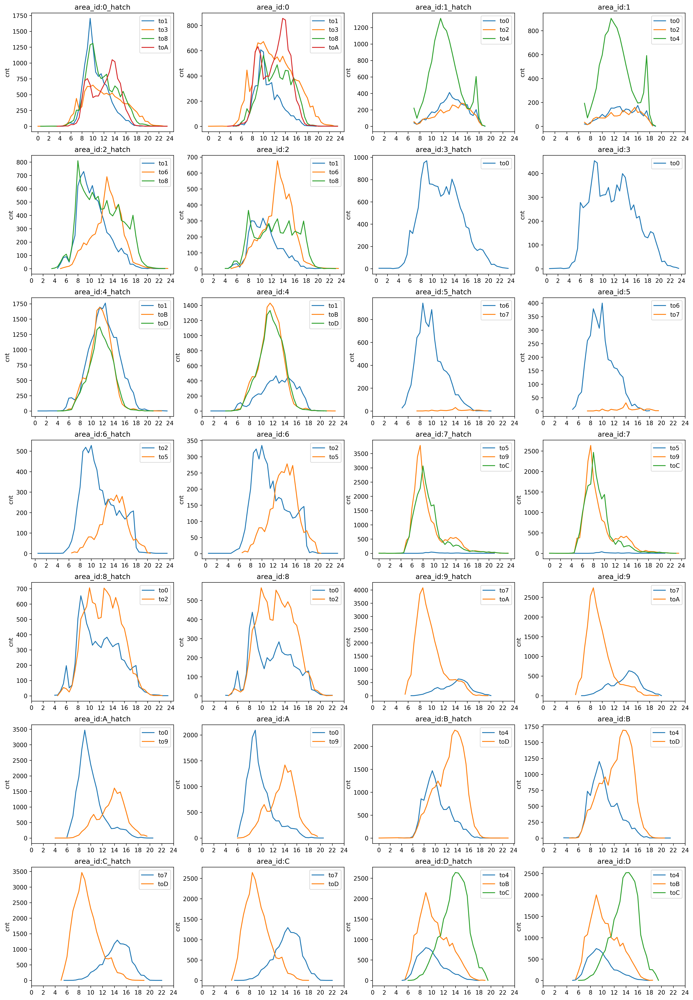

In [27]:
area_hatch = area_lost[['mac','date','area_id','areaTNext','tw','tw_all','festival']]
area_hatch = area_hatch.reset_index(drop=True)
#绘制两点间人流随时刻的变化（半小时为单位,补全后）
fig = plt.figure(figsize=(20,35),dpi=300)
def draw_tw(area_id,area_next,k):
    l = len(area_next)
    ax1 = fig.add_subplot(28//4 + 1,4,2*k+1)
    ax1.set_title('area_id:'+area_id+'_hatch')
    for j in range(l): 
        tw_temp = area_hatch[area_hatch.area_id == area_id][area_hatch.areaTNext == area_next[j]]
        tw_temp.tw = tw_temp.tw // 6
        tw_temp = tw_temp.groupby(['tw']).apply(len).reset_index(name='cnt')
        ax1.plot(tw_temp.tw, tw_temp.cnt, label='to'+area_next[j])
    #ax1.set_xlabel('time/0.5h')
    ax1.set_xticks(np.arange(0,49,4))
    ax1.set_xticklabels(np.arange(0,25,2))
    ax1.legend()
    ax1.set_ylabel('cnt')
    
    ax2 = fig.add_subplot(28//4 + 1,4,2*k+2)
    ax2.set_title('area_id:'+area_id)
    for j in range(l): 
        tw_temp = trace_flow[trace_flow.area_id == area_id][trace_flow.area_next == area_next[j]]
        tw_temp.tw = tw_temp.tw // 6
        tw_temp = tw_temp.groupby(['tw']).apply(len).reset_index(name='cnt')
        ax2.plot(tw_temp.tw, tw_temp.cnt, label='to'+area_next[j])
    #ax2.set_xlabel('time/0.5h')
    ax2.set_xticks(np.arange(0,49,4))
    ax2.set_xticklabels(np.arange(0,25,2))
    ax2.set_ylabel('cnt')
    ax2.legend()

for i in range(14):
    draw_tw(area_move.iloc[i,0],area_move.iloc[i,1],i)

#fig.savefig('/Users/zhangyu/Desktop/HuangShan/picture/5.jpg')

/Users/zhangyu/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/Users/zhangyu/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:18: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


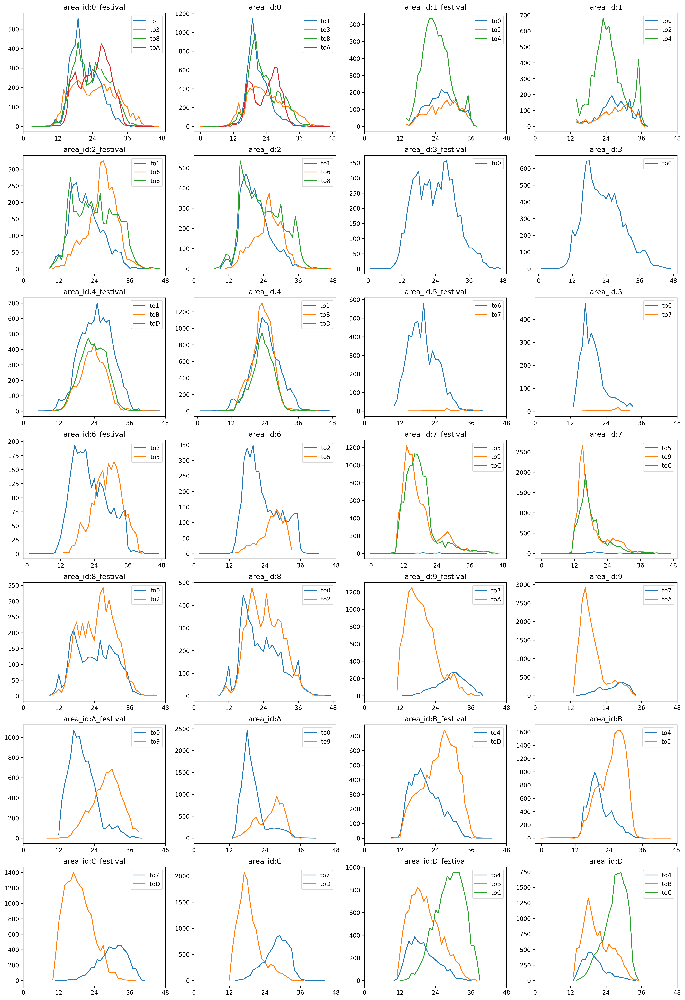

In [44]:
#绘制两点间人流随时刻的变化（半小时为单位,补全后）
fig = plt.figure(figsize=(20,35),dpi=300)
def draw_tw(area_id,area_next,k):
    l = len(area_next)
    ax1 = fig.add_subplot(28//4 + 1,4,2*k+1)
    ax1.set_title('area_id:'+area_id+'_festival')
    for j in range(l): 
        tw_temp = area_hatch[area_hatch.festival == True][area_hatch.area_id == area_id][area_hatch.areaTNext == area_next[j]]
        tw_temp.tw = tw_temp.tw // 6
        tw_temp = tw_temp.groupby(['tw']).apply(len).reset_index(name='cnt')
        ax1.plot(tw_temp.tw, tw_temp.cnt, label='to'+area_next[j])
        ax1.legend()
        ax1.set_xticks(np.arange(0,49,12))
        
    ax2 = fig.add_subplot(28//4 + 1,4,2*k+2)
    ax2.set_title('area_id:'+area_id)
    for j in range(l): 
        tw_temp = area_hatch[area_hatch.festival == False][area_hatch.area_id == area_id][area_hatch.areaTNext == area_next[j]]
        tw_temp.tw = tw_temp.tw // 6
        tw_temp = tw_temp.groupby(['tw']).apply(len).reset_index(name='cnt')
        ax2.plot(tw_temp.tw, tw_temp.cnt, label='to'+area_next[j])
        ax2.legend()
        ax2.set_xticks(np.arange(0,49,12))

for i in range(14):
    draw_tw(area_move.iloc[i,0],area_move.iloc[i,1],i)

# 缺失值填充检验

In [30]:
g_data

,ap_seq,cnt,date,mac,ssid,tw,tw_all,mac6,vendor,mobile,area_id,weekday,festival,date_s
0,14,13.0,2017-02-05,0012FE15AACD,.,116.0,5012,0012FE,Lenovo Mobile,True,12,False,False,1.0
1,15,28.0,2017-02-05,0012FE15AACD,.,117.0,5013,0012FE,Lenovo Mobile,True,12,False,False,1.0
2,15,28.0,2017-02-05,0012FE15AACD,.,118.0,5014,0012FE,Lenovo Mobile,True,12,False,False,1.0
3,15,18.0,2017-02-05,0012FE15AACD,.,119.0,5015,0012FE,Lenovo Mobile,True,12,False,False,1.0
4,15,9.0,2017-02-05,0012FE15AACD,.,120.0,5016,0012FE,Lenovo Mobile,True,12,False,False,1.0
5,14,37.0,2017-02-05,0012FE15AACD,.,121.0,5017,0012FE,Lenovo Mobile,True,12,False,False,1.0
6,14,27.0,2017-02-05,0012FE15AACD,.,122.0,5018,0012FE,Lenovo Mobile,True,12,False,False,1.0
7,14,23.0,2017-02-05,0012FE15AACD,.,123.0,5019,0012FE,Lenovo Mobile,True,12,False,False,1.0
8,14,26.0,2017-02-05,0012FE15AACD,.,124.0,5020,0012FE,Lenovo Mobile,True,12,False,False,1.0
9,14,17.0,2017-02-05,0012FE15AACD,.,125.0,5021,0012FE,Lenovo Mobile,True,12,False,False,1.0


# 完整路径描绘

In [53]:
def date_count(frame):
    frame = frame.sort_values('date')
    frame['date_stay'] = (frame.date.iloc[-1] - frame.date.iloc[0])/pd.Timedelta('1d') + 1
    frame['date_s'] = frame.date.iloc[0]
    frame['date_e'] = frame.date.iloc[-1]
    return frame
    
area_lost = area_lost.groupby('mac').apply(date_count).reset_index(drop=True)

def draw_route(frame):
    if frame.p.all():
        frame = frame.sort_values('tw_all').reset_index(drop = True)
        l = len(frame.route)
        path = ''
        for i in range(l):
            if i == 0:
                path = path + frame.route[i]
            else:
                path = path + frame.route[i][1:]
        frame['path'] = path
        frame.area_hatch = frame.area_hatch.sum()
    return frame

trace_hatch1 = area_lost.groupby(['mac','date']).apply(draw_route)
trace_hatch1 = trace_hatch1[['mac','date_s','date_e','date_stay','tw','tw_all','path','area_id','stay','area_hatch','festival']].reset_index(drop=True).dropna(axis=0)
trace_hatch2 = area_lost.groupby('mac').apply(draw_route)
trace_hatch2 = trace_hatch2[['mac','date_s','date_e','date_stay','tw','tw_all','path','area_id','stay','area_hatch','festival']].reset_index(drop=True).dropna(axis=0)

In [54]:
def route_time1(frame):
    frame = frame.sort_values('tw')
    frame['tw_s'] = frame.tw.iloc[0]
    if frame.shape[0] != 1:
        if frame.area_id.iloc[1] in ['C','9','5']:
            frame['tw_cableup'] = frame.tw.iloc[1]
        if frame.area_id.iloc[-2] in ['C','9','5']:
            frame['tw_cabledown'] = frame.tw.iloc[-2]
    frame['tw_e'] = frame.tw.iloc[-1]
    frame['tw_gap'] = frame.tw.iloc[-1] - frame.tw.iloc[0]
    frame['area_s'] = frame.path.iloc[0][0]
    if frame.path.iloc[0][-1] == 'E':
        frame['area_e'] = frame.path.iloc[0][-2]
    elif frame.path.iloc[0][-1] == 'E' and frame.path.iloc[0][-2] == '.':
        frame['area_e'] = frame.path.iloc[0][-3]
    else:
        frame['area_e'] = frame.path.iloc[0][-1]
    return frame

def route_time2(frame):
    frame = frame.sort_values('tw_all')
    frame['tw_s'] = frame.tw.iloc[0]
    if frame.shape[0] != 1:
        if frame.area_id.iloc[1] in ['C','9','5']:
            frame['tw_cableup'] = frame.tw.iloc[1]
        if frame.area_id.iloc[-2] in ['C','9','5']:
            frame['tw_cabledown'] = frame.tw.iloc[-2]
    frame['tw_e'] = frame.tw.iloc[-1]
    frame['tw_gap'] = frame.tw_all.iloc[-1] - frame.tw_all.iloc[0]
    frame['area_s'] = frame.path.iloc[0][0]
    if frame.path.iloc[0][-1] == 'E':
        frame['area_e'] = frame.path.iloc[0][-2]
    elif frame.path.iloc[0][-1] == 'E' and frame.path.iloc[0][-2] == '.':
        frame['area_e'] = frame.path.iloc[0][-3]
    else:
        frame['area_e'] = frame.path.iloc[0][-1]
    return frame

#trace_hatch1 = trace_hatch1.groupby('mac').apply(route_time1)
trace_hatch2 = trace_hatch2.groupby('mac').apply(route_time2)
#trace_1 = trace_hatch1[['mac','date_s','date_e','date_stay','path','tw_s','tw_cableup','tw_cabledown','tw_e','tw_gap','area_s','area_e','area_hatch']].drop_duplicates()
trace_2 = trace_hatch2[['mac','date_s','date_e','date_stay','path','tw_s','tw_cableup','tw_cabledown','tw_e','tw_gap','area_s','area_e','area_hatch','festival']].drop_duplicates()

In [3]:
trace_complete = trace_2[trace_2.area_s.isin(['7','5','C','9'])][trace_2.area_e.isin(['7','5','C','9'])]
def cableway(frame):
    route = frame.path.iloc[0]
    if route[0] == '7':
        frame['cable_up'] = route[1]
    else:
        frame['cable_up'] = route[0]
    if route[-2] == '7':
        if route[-3] == '.':
            frame['cable_down'] = route[-4]
        else:
            frame['cable_down'] = route[-3]
    else:
        frame['cable_down'] = route[-2]
    return frame

trace_complete = trace_complete.groupby('mac').apply(cableway).reset_index(drop=True)

/Users/zhangyu/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


In [4]:
#得到索道上下站的时间信息
trace_complete.tw_cableup = np.where(trace_complete.area_s == '7', trace_complete.tw_cableup, trace_complete.tw_s)
trace_complete.tw_cabledown = np.where(trace_complete.area_e == '7', trace_complete.tw_cabledown, trace_complete.tw_e)
trace_cable = trace_complete.iloc[trace_complete.tw_cableup.dropna().index]
trace_cable = trace_cable.groupby(['cable_up','tw_cableup']).apply(len).reset_index()
trace_cable.columns = ['cable_up','tw_cableup','cnt']
tw_cableup = pd.DataFrame(np.arange(288))
tw_cableup.columns = ['tw_cableup']
tw_cableup.tw_cableup = tw_cableup.tw_cableup.astype(float)
temp = pd.merge(tw_cableup, trace_cable[trace_cable.cable_up == '5'], on='tw_cableup', how='left')
temp = pd.merge(temp, trace_cable[trace_cable.cable_up == '9'], on='tw_cableup', how='left')
temp = pd.merge(temp, trace_cable[trace_cable.cable_up == 'C'], on='tw_cableup', how='left')
trace_cable = temp[['tw_cableup','cnt_x','cnt_y','cnt']]
trace_cable.columns = ['tw_cableup','cable5','cable9','cableC']
trace_cable = trace_cable.fillna(0)
trace_cable.cable5 = (trace_cable.cable5/2).astype(int)
trace_cable.cable9 = (trace_cable.cable9/2).astype(int)
trace_cable.cableC = (trace_cable.cableC/2).astype(int)

AttributeError: 'DataFrame' object has no attribute 'tw_cableup'

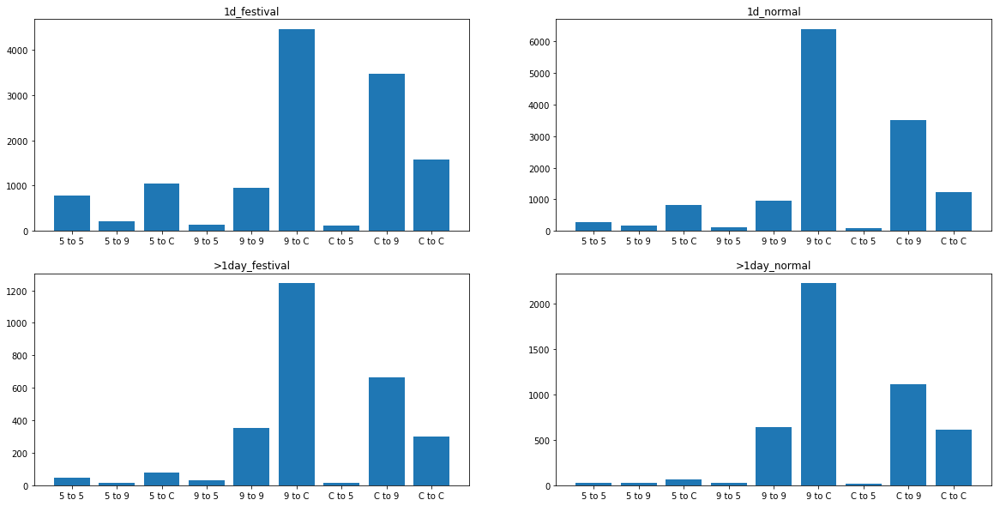

In [57]:
#完整路径中索道上下站情况
day1 = trace_complete[trace_complete.date_stay == 1]
day2 = trace_complete[trace_complete.date_stay > 1]
trace_temp = day1.groupby(['cable_up','cable_down','festival']).apply(len).reset_index(name='num')
trace_temp['move'] = trace_temp.cable_up + ' to ' + trace_temp.cable_down
fig = plt.figure(1, figsize=(20,10))  
ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)
ax1.bar(np.arange(9), height = trace_temp[trace_temp.festival == True].num)
ax1.set_xticks(np.arange(9))
ax1.set_xticklabels(trace_temp[trace_temp.festival == True].move)
ax1.set_title('1d_festival')
ax2.bar(np.arange(9), height = trace_temp[trace_temp.festival == False].num)
ax2.set_xticks(np.arange(9))
ax2.set_xticklabels(trace_temp[trace_temp.festival == True].move)
ax2.set_title('1d_normal')

trace_temp = day2.groupby(['cable_up','cable_down','festival']).apply(len).reset_index(name='num')
trace_temp['move'] = trace_temp.cable_up + ' to ' + trace_temp.cable_down
ax3 = fig.add_subplot(223)
ax4 = fig.add_subplot(224)
ax3.bar(np.arange(9), height = trace_temp[trace_temp.festival == True].num)
ax3.set_xticks(np.arange(9))
ax3.set_xticklabels(trace_temp[trace_temp.festival == True].move)
ax3.set_title('>1day_festival')
ax4.bar(np.arange(9), height = trace_temp[trace_temp.festival == False].num)
ax4.set_xticks(np.arange(9))
ax4.set_xticklabels(trace_temp[trace_temp.festival == True].move)
ax4.set_title('>1day_normal')

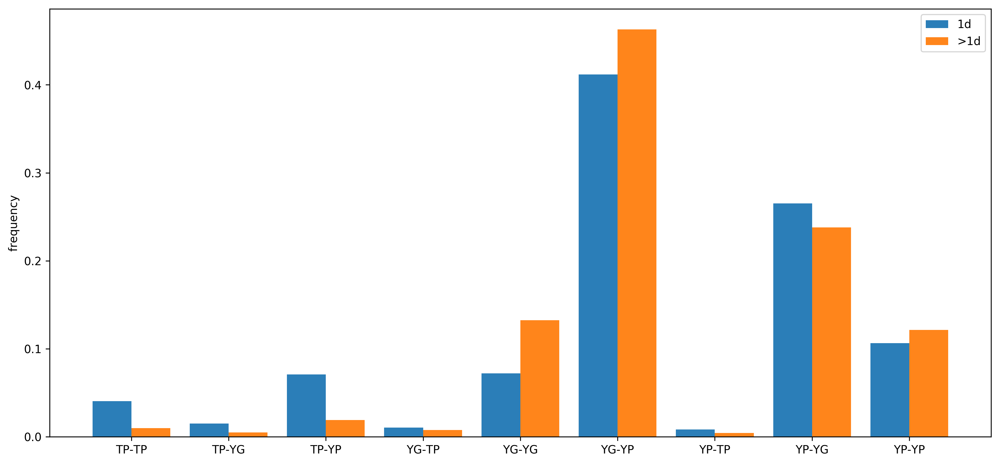

In [60]:
%matplotlib inline
day1 = trace_complete[trace_complete.date_stay == 1]
day2 = trace_complete[trace_complete.date_stay > 1]
trace_temp = day1.groupby(['cable_up','cable_down']).apply(len).reset_index(name='num')
trace_temp['move'] = trace_temp.cable_up + ' to ' + trace_temp.cable_down
trace_temp.num = trace_temp.num/trace_temp.num.sum()
fig = plt.figure(figsize=(15,7), dpi=300)  
ax = fig.add_subplot(111)
ax.bar(np.arange(0,18,2), height = trace_temp.num, label='1d', alpha=0.95)

trace_temp = day2.groupby(['cable_up','cable_down']).apply(len).reset_index(name='num')
trace_temp['move'] = trace_temp.cable_up + ' to ' + trace_temp.cable_down
trace_temp.num = trace_temp.num/trace_temp.num.sum()
ax.bar(np.arange(0.8,18.8,2), height = trace_temp.num, label='>1d', alpha=0.95)

ax.set_xticks(np.arange(0.4,18.4,2))
cable_name = ['TP-TP','TP-YG','TP-YP','YG-TP','YG-YG','YG-YP','YP-TP','YP-YG','YP-YP']
ax.set_xticklabels(cable_name)
ax.legend()
ax.set_ylabel('frequency')

fig.savefig('/Users/zhangyu/Desktop/HuangShan/picture/1.jpg')

/Users/zhangyu/anaconda/lib/python3.6/site-packages/pandas/core/generic.py:2999: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[name] = value


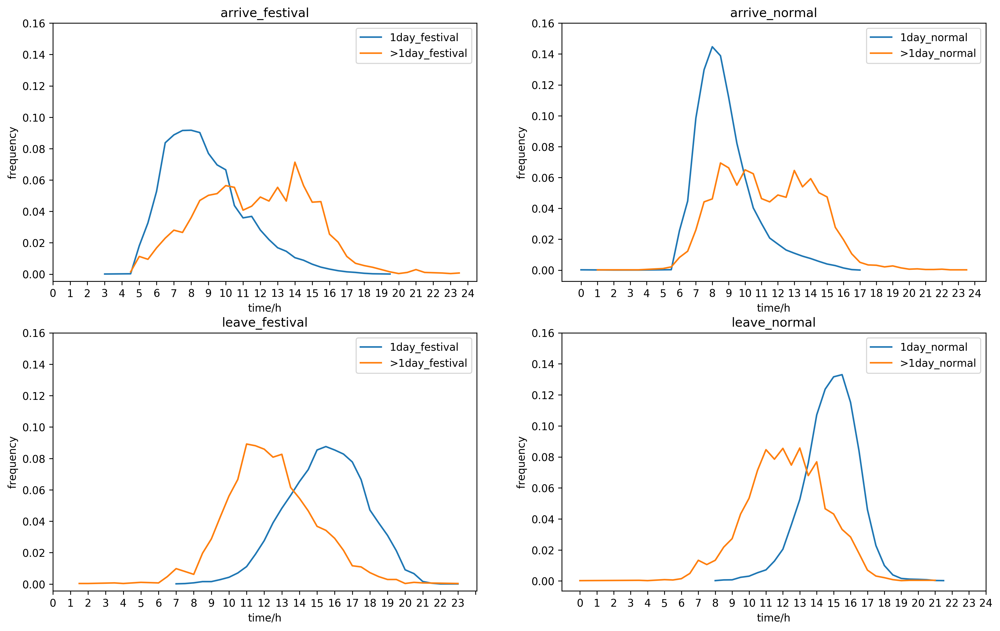

In [61]:
#在山上待一天和超过一天间到达离开黄山的tw分布
fig = plt.figure(figsize=(16,10),dpi=300)  
ax1 = fig.add_subplot(2,2,1)
ax2 = fig.add_subplot(2,2,2)
ax3 = fig.add_subplot(2,2,3)
ax4 = fig.add_subplot(2,2,4)
day1.tw_s = (day1.tw_s/6).astype(int)
day1.tw_e = (day1.tw_e/6).astype(int)
day2.tw_s = (day2.tw_s/6).astype(int)
day2.tw_e = (day2.tw_e/6).astype(int)
ax1.plot(day1[day1.festival == True].groupby('tw_s').apply(len)/(day1[day1.festival == True].groupby('tw_s').apply(len).sum()), label='1day_festival')
ax2.plot(day1[day1.festival == False].groupby('tw_s').apply(len)/(day1[day1.festival == False].groupby('tw_s').apply(len).sum()), label='1day_normal')
ax1.plot(day2[day2.festival == True].groupby('tw_s').apply(len)/(day2[day2.festival == True].groupby('tw_s').apply(len).sum()), label='>1day_festival')
ax2.plot(day2[day2.festival == False].groupby('tw_s').apply(len)/(day2[day2.festival == False].groupby('tw_s').apply(len).sum()), label='>1day_normal')
ax1.set_xticks(np.arange(0,49,2))
ax1.set_xticklabels(np.arange(0,25,1))
ax2.set_xticks(np.arange(0,49,2))
ax2.set_xticklabels(np.arange(0,25,1))
ax1.set_title('arrive_festival')
ax2.set_title('arrive_normal')
ax3.plot(day1[day1.festival == True].groupby('tw_e').apply(len)/(day1[day1.festival == True].groupby('tw_e').apply(len).sum()), label='1day_festival')
ax4.plot(day1[day1.festival == False].groupby('tw_e').apply(len)/(day1[day1.festival == False].groupby('tw_e').apply(len).sum()), label='1day_normal')
ax3.plot(day2[day2.festival == True].groupby('tw_e').apply(len)/(day2[day2.festival == True].groupby('tw_e').apply(len).sum()), label='>1day_festival')
ax4.plot(day2[day2.festival == False].groupby('tw_e').apply(len)/(day2[day2.festival == False].groupby('tw_e').apply(len).sum()), label='>1day_normal')
ax3.set_xticks(np.arange(0,49,2))
ax3.set_xticklabels(np.arange(0,24,1))
ax4.set_xticks(np.arange(0,49,2))
ax4.set_xticklabels(np.arange(0,25,1))
ax3.set_title('leave_festival')
ax4.set_title('leave_normal')
ax = [ax1,ax2,ax3,ax4]
for ax_temp in ax:
    ax_temp.legend()
    ax_temp.set_yticks(np.arange(0,0.18,0.02))
    ax_temp.set_xlabel('time/h')
    ax_temp.set_ylabel('frequency')
fig.savefig('/Users/zhangyu/Desktop/HuangShan/picture/2.jpg')

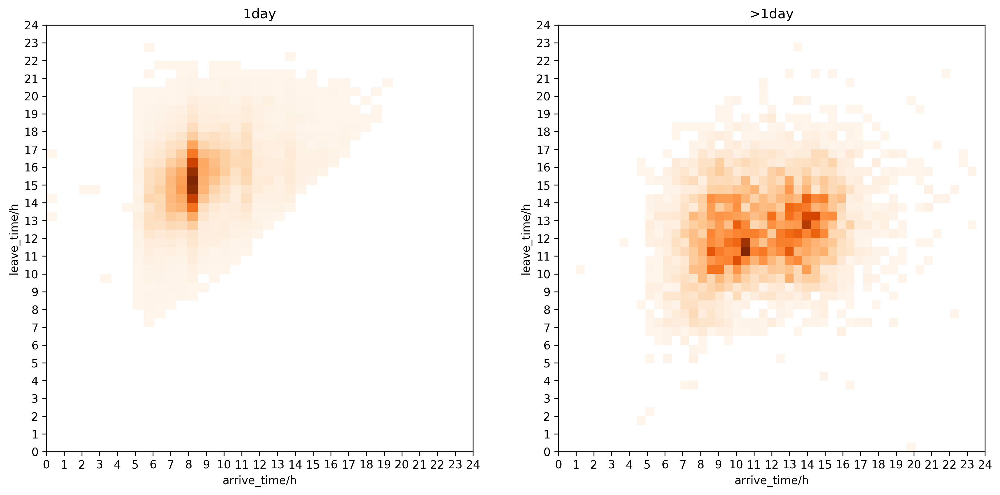

In [65]:
#到达离开时间
fig = plt.figure(1, figsize=(15,7), dpi=300)
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
ax1.hist2d(day1.tw_s, day1.tw_e, cmap='Oranges', bins=day1.tw_e.max() - day1.tw_e.min(), cmin=1)
ax1.set_xticks(np.arange(0,49,2))
ax1.set_yticks(np.arange(0,49,2))
ax1.set_xticklabels(np.arange(0,25,1))
ax1.set_yticklabels(np.arange(0,25,1))
ax1.set_title('1day')

ax2.hist2d(day2.tw_s, day2.tw_e, cmap='Oranges', bins=day2.tw_e.max() - day2.tw_e.min(), cmin=1)
ax2.set_xticks(np.arange(0,49,2))
ax2.set_yticks(np.arange(0,49,2))
ax2.set_xticklabels(np.arange(0,25,1))
ax2.set_yticklabels(np.arange(0,25,1))
ax2.set_title('>1day')
ax1.set_xlabel('arrive_time/h')
ax1.set_ylabel('leave_time/h')
ax2.set_xlabel('arrive_time/h')
ax2.set_ylabel('leave_time/h')

fig.savefig('/Users/zhangyu/Desktop/HuangShan/picture/3.jpg')

(array([  3.33400000e+03,   3.81000000e+03,   4.87100000e+03,
          4.59800000e+03,   3.93300000e+03,   3.60600000e+03,
          2.78400000e+03,   1.85000000e+03,   1.54500000e+03,
          7.22000000e+02,   4.36000000e+02,   3.20000000e+02,
          2.68000000e+02,   1.42000000e+02,   9.30000000e+01,
          4.60000000e+01,   5.30000000e+01,   9.00000000e+00,
          4.00000000e+00,   8.00000000e+00,   5.00000000e+00,
          3.00000000e+00,   1.00000000e+00,   0.00000000e+00,
          0.00000000e+00,   0.00000000e+00,   0.00000000e+00,
          0.00000000e+00,   0.00000000e+00,   0.00000000e+00,
          0.00000000e+00,   0.00000000e+00,   0.00000000e+00,
          0.00000000e+00,   0.00000000e+00,   0.00000000e+00,
          0.00000000e+00,   1.00000000e+00]),
 array([  0.,   1.,   2.,   3.,   4.,   5.,   6.,   7.,   8.,   9.,  10.,
         11.,  12.,  13.,  14.,  15.,  16.,  17.,  18.,  19.,  20.,  21.,
         22.,  23.,  24.,  25.,  26.,  27.,  28.,  29.,  30., 

/Users/zhangyu/anaconda/lib/python3.6/site-packages/matplotlib/font_manager.py:1297: UserWarning: findfont: Font family ['SimHei'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


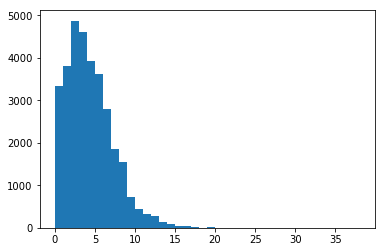

In [27]:
#路径填充情况
plt.hist(trace_complete.area_hatch, bins=38)

In [53]:
trace_complete1 = trace_complete[trace_complete.date_stay == 1]
trace_complete1.path = trace_complete1.path.apply(lambda x:x.replace('.',''))
trace_complete1.path = trace_complete1.path.apply(lambda x:x.replace('E',''))
trace_complete2 = trace_complete[trace_complete.date_stay > 1]
trace_complete2.path = trace_complete2.path.apply(lambda x:x.replace('.',''))
trace_complete2.path = trace_complete2.path.apply(lambda x:x.replace('E',''))

/Users/zhangyu/anaconda/lib/python3.6/site-packages/pandas/core/generic.py:2999: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[name] = value


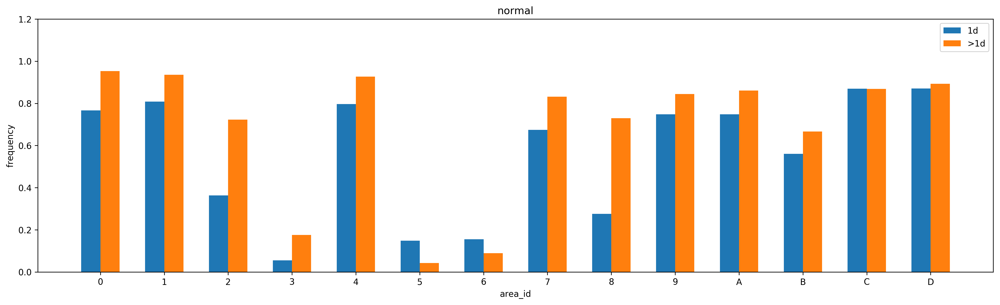

In [147]:
fig = plt.figure(figsize=(20,12),dpi=300)
area1 = []
area2 = []
ax1 = fig.add_subplot(211)
for area in sixteen:
    area1.append(trace_complete1.path.apply(lambda x: area in x).sum()/trace_complete1.shape[0])
    area2.append(trace_complete2.path.apply(lambda x: area in x).sum()/trace_complete2.shape[0])
area1 = np.array(area1)
area2 = np.array(area2)
ax1.bar(np.arange(0.2,28.2,2), height = area1, width=0.6, label='1d')
ax1.bar(np.arange(0.8,28.8,2), height = area2, width=0.6, label='>1d')
ax1.set_xticks(np.arange(0.5,28.5,2))
ax1.set_xticklabels(sixteen)
ax1.set_title('normal')
ax1.legend()
ax1.set_yticks(np.arange(0,1.3,0.2))
ax1.set_xlabel('area_id')
ax1.set_ylabel('frequency')

fig.savefig('/Users/zhangyu/Desktop/HuangShan/picture/4.jpg')

In [55]:
trace_complete1.groupby('path').apply(len).sort_values().tail(50)

path
5628014BDC7      107
CDBDC7           107
56214DBDC7       109
9A0A9            114
7CD41280A97      121
7CDBD41280A97    122
7CDBD410A9       135
79A014DBDC       137
79A0A97          138
79A97            154
9A014DBDC        161
9A014DC7         162
7CDC             165
7CDB41280A9      168
CDBD410A9        177
56214DC          178
9A9              180
CDB41280A9       182
9A014BDC7        204
CDB410A97        209
7CDC7            216
56214DC7         242
CD410A9          248
9A08214DC        255
79A014DBDC7      259
7CDBDC           267
7CDBD410A97      268
56214BDC         278
56265            306
7CDB41280A97     312
79A08214DC       328
CDC              335
79A08214DC7      342
9A08214BDC       353
56214BDC7        382
79A08214BDC      386
7CD410A9         391
CDBDC            436
7CDBDC7          467
79A08214BDC7     492
7CD410A97        523
CDB410A9         550
7CDB410A9        576
79A014DC         686
79A014DC7        714
9A014DC          747
7CDB410A97       766
79A014BD

In [56]:
trace_complete2.groupby('path').apply(len).sort_values().tail(50)

path
9A080A9               20
79A0A97               21
79A03014BDC           21
9A0308214BDC          21
79A0308214BDC         22
79A0828014DC          23
79A0828014BDC         23
7CDBD410A97           23
79A03014DC            24
79A080A97             25
9A08214DC7            25
7CDB412808214BDC7     25
79A03014BDC7          25
7CD41280A9            26
7CD4108214BDC7        28
7CDBD41280A9          29
79A0141280A97         30
79A014DBDC7           30
9A03014DC             31
79A0828014BDC7        32
7CDBDC7               33
79A0308214BDC7        33
7CD410A97             35
CDB410A9              36
7CDB4108280A97        36
79A08214DBDC          40
79A03014DC7           43
9A014DC               47
9A014BDC              48
CDB41280A9            49
7CD41280A97           51
79A014DC              52
7CDBD41280A97         55
CDB41280A97           58
7CDB410A9             63
79A014BDC             63
9A08214DC             65
9A08214BDC7           73
79A08214DBDC7         77
79A014DC7           

# 频繁项集发现

In [33]:
os.chdir('/Users/zhangyu/Desktop/HuangShan/script')
import PrefixSpan
minSupport = 0.005
patterns1 = PrefixSpan.PrefixSpan(trace_complete1.path, minSupport)
patterns1 = pd.DataFrame(patterns1, columns=['Fp','support'])
patterns1.support = patterns1.support/float(trace_complete1.shape[0])
patterns2 = PrefixSpan.PrefixSpan(trace_complete2.path, minSupport)
patterns2 = pd.DataFrame(patterns2, columns=['Fp','support'])
patterns2.support = patterns2.support/float(trace_complete2.shape[0])
patterns1['fplen'] = patterns1.Fp.apply(len)
patterns2['fplen'] = patterns2.Fp.apply(len)

In [34]:
patterns1 = patterns1.sort_values('support')
patterns1[patterns1.fplen > 4].tail(50)

,Fp,support,fplen
45930,"[[A], [0], [1], [B], [C]]",0.292915,5
46084,"[[A], [0], [1], [4], [B], [C]]",0.292915,6
43132,"[[A], [4], [B], [D], [C]]",0.292915,5
45626,"[[A], [0], [B], [D], [C]]",0.292915,5
46088,"[[A], [0], [1], [4], [B], [D], [C]]",0.292915,7
43440,"[[A], [1], [4], [B], [D], [C]]",0.292915,6
45776,"[[A], [0], [4], [B], [C]]",0.292915,5
45934,"[[A], [0], [1], [B], [D], [C]]",0.292915,6
43286,"[[A], [1], [B], [D], [C]]",0.292915,5
45780,"[[A], [0], [4], [B], [D], [C]]",0.292915,6


In [35]:
patterns2 = patterns2.sort_values('support')
patterns2[patterns2.fplen > 4].tail(50)

,Fp,support,fplen
1096091,"[[9], [A], [0], [8], [1]]",0.416087,5
1461583,"[[A], [0], [8], [1], [4]]",0.416229,5
378033,"[[7], [9], [A], [0], [1]]",0.417222,5
1658845,"[[1], [4], [B], [D], [C]]",0.418357,5
656799,"[[7], [A], [0], [1], [4]]",0.419776,5
1708668,"[[0], [2], [1], [4], [D]]",0.423464,5
1730179,"[[0], [8], [1], [D], [C]]",0.426869,5
1717028,"[[0], [8], [4], [D], [C]]",0.426869,5
1731932,"[[0], [8], [1], [4], [D], [C]]",0.426869,6
1731168,"[[0], [8], [1], [4], [C]]",0.427011,5


# 人流模拟

In [70]:
#得到每个点去往下个点的随时间变化的概率
pKey = {}
def choiceP(frame):
    cntSum = 0
    tw = frame.tw.iloc[0]
    for area in area_next:
        cntSum = cntSum + frame[area].iloc[0]
    
    plist = []
    if cntSum == 0:
        plist = pd.Series(area_next).reset_index(name='area_next')
        plist['p'] = 1/l #没有记录的时刻填充为等可能
        plist = plist[['area_next','p']]
        pKey[area_seq + str(tw)] = plist
    else:
        for area in area_next:
            plist.append(frame[area].iloc[0]/cntSum)
        plist = pd.Series(dict(zip(area_next, plist))).reset_index(name='p')
        plist.columns = ['area_next', 'p']
        pKey[area_seq + str(tw)] = plist
        
for i in range(14):
    area_seq = sixteen[i]
    area_temp = area_hatch[area_hatch.area_id == area_seq]
    area_next = area_move[area_move.area_seq == area_seq].area_next.iloc[0]
    area_temp = area_temp[area_temp.areaTNext.apply(lambda x: x in area_next)]
    area_temp.tw = area_temp.tw//6
    area_temp = area_temp.groupby(['areaTNext','tw']).apply(len).reset_index(name='cnt')
    p = pd.DataFrame(np.arange(48), columns=['tw'])
    for area in area_next:
        p_temp = area_temp[area_temp.areaTNext == area][['tw','cnt']]
        p_temp.columns = ['tw', area]
        p = pd.merge(p, p_temp, on=['tw'], how='left')
    p = p.fillna(0)
    l = len(area_next)
    p.groupby('tw').apply(choiceP)

In [74]:
class Agent():
    tw = 0
    def __init__(self):
        self.area_seq = 'D'
        self.area_next = ''
        self.area_last = ''
        self.active = False
        self.areaNextList = []
        self.gap = '' #记录处于哪段路上
        self.time = 0 #停留或gap所花时间
        self.mode = 'gap' #stay or gap
        self.key = self.area_seq+str(self.tw//6)
        self.possList = pd.DataFrame() #记录概率的dataframe
        self.wayUp = False
    
    #计算在每个点的随机停留时长
    def stayTime(self):
        plist = stayFes[stayFes.area_id == self.area_seq].des_list.iloc[0]
        plist = pd.Series(plist)
        plist = plist/plist.sum()
        self.time = np.random.choice(np.arange(72), p=plist)
        self.mode = 'stay'
        self.area_last = self.area_seq
        self.area_seq = self.area_next
        #随机到停留时长为0，即刻前往下一个点
        if self.time == 0:
            self.wayChoice()
            self.gapTime()
    
    #计算在每个gap的随机停留时长
    def gapTime(self):   
        plist = gapFes[gapFes.area_move == self.area_seq + self.area_next].des_list.iloc[0]
        plist = pd.Series(plist)
        plist = plist/plist.sum()
        self.time = np.random.choice(np.arange(73), p=plist)
        self.mode = 'gap'
    
    #选择下一个点
    def wayChoice(self):
        self.possList = pKey[self.area_seq+str(self.tw//6)]
        if self.possList.shape[0] != 1:
            self.possList = self.possList[self.possList.area_next != self.area_last]
            self.areaNextList = list(self.possList.area_next)
            self.area_next = np.random.choice(self.areaNextList, p=list(self.possList.p/self.possList.p.sum()))
        else:
            self.area_next = self.area_last
        self.gap = self.area_seq + self.area_next
        
    def refresh(self):
        if self.active:
            #消耗gap或stay的时间
            self.time = self.time - 1
            if self.time < 0:
                #gap时间耗尽，到达下一个点
                if self.mode == 'gap':
                    self.stayTime()
                #stay时间耗尽，将前往下一个点
                else:
                    self.wayChoice()
                    self.gapTime()
                #判断是不是下山
                if (self.area_seq in ['6','A','D']) and (self.area_next in ['5','C','9']):
                    self.active = False
    
    def set_active(self, location):
        self.active = True
        self.time = 0
        self.area_seq = location
        self.mode = 'gap'
        self.area_next = location

In [72]:
area_locate = pd.read_csv('/Users/zhangyu/Desktop/HuangShan/info/area.csv', encoding='gbk')
area_locate.area_id = area_locate.area_id.replace([0,1,2,3,4,5,6,7,8,9,10,11,12,13],
                           ['0','1','2','3','4','5','6','7','8','9','A','B','C','D'])
area_route = gapFes[['area_move']]
area_route.columns = ['route']
area_route['sPoint'] = area_route.route.apply(lambda x: x[0])
area_route['ePoint'] = area_route.route.apply(lambda x: x[1])
area_route.columns = ['route','area_id','ePoint']
area_route = pd.merge(area_route, area_locate[['area_id', 'x', 'y']], on=['area_id'])
area_route.columns = ['route','sPoint','area_id','sx','sy']
area_route = pd.merge(area_route, area_locate[['area_id', 'x', 'y']], on=['area_id'])
area_route = area_route[['route','sx','sy','x','y']]
area_route.columns = ['route','sx','sy','ex','ey']

/Users/zhangyu/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [100]:
agentList = pd.Series([Agent() for i in range(20000)])
agentList = agentList.reset_index()
agentList.columns = ['num','agent']

agentData = pd.DataFrame()
agentData['active'] = agentList.agent.apply(lambda x:x.active)
agentData['mode'] = agentList.agent.apply(lambda x:x.mode)
agentData['area_id'] = agentList.agent.apply(lambda x:x.area_seq)
agentData['route'] = agentList.agent.apply(lambda x:x.gap)

stayData = area_locate[['area','area_id','x','y']]
traceData = area_route[['route','sx','sy','ex','ey']]

def activeAgent(tw):
    #分别在三个索道上站点传入人流
    s = trace_cable[trace_cable.tw_cableup == tw]
    s1 = s.cable5.iloc[0]
    s2 = s.cable9.iloc[0]
    s3 = s.cableC.iloc[0]
    key1 = np.random.choice(agentList[agentList.agent.apply(lambda x:x.active) == False].num, size=s3, replace=False)
    agentList.iloc[key1].agent.apply(lambda x:x.set_active('D'))
    key2 = np.random.choice(agentList[agentList.agent.apply(lambda x:x.active) == False].num, size=s2, replace=False)
    agentList.iloc[key2].agent.apply(lambda x:x.set_active('A'))
    key3 = np.random.choice(agentList[agentList.agent.apply(lambda x:x.active) == False].num, size=s1, replace=False)
    agentList.iloc[key3].agent.apply(lambda x:x.set_active('6'))
    
def agent_refresh(stayData, traceData):
    activeAgent(Agent.tw)
    agentList.agent.apply(lambda x:x.refresh())
    agentData.active = agentList.agent.apply(lambda x:x.active)
    agentData.mode = agentList.agent.apply(lambda x:x.mode)
    agentData.area_id = agentList.agent.apply(lambda x:x.area_seq)
    agentData.route = agentList.agent.apply(lambda x:x.gap)
    stayData_temp = agentData[agentData.active == True][agentData.mode == 'stay'].groupby('area_id').apply(len).reset_index(name='cnt'+str(Agent.tw))
    stayData = pd.merge(stayData, stayData_temp, on=['area_id'], how='left')
    traceData_temp = agentData[agentData.active == True][agentData.mode == 'gap'].groupby('route').apply(len).reset_index(name='cnt'+str(Agent.tw))
    traceData = pd.merge(traceData, traceData_temp, on=['route'], how='left')
    Agent.tw = Agent.tw + 1
    return stayData, traceData

#初始模拟开始时间
Agent.tw = 72

for i in range(216):
    stayData, traceData = agent_refresh(stayData, traceData)

stayData = stayData.fillna(0)
traceData = traceData.fillna(0)

/Users/zhangyu/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:34: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/Users/zhangyu/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:36: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


In [174]:
stayData.to_csv('/Users/zhangyu/Desktop/stayData.csv')
traceData.to_csv('/Users/zhangyu/Desktop/traceData.csv')

<IPython.core.display.Javascript object>


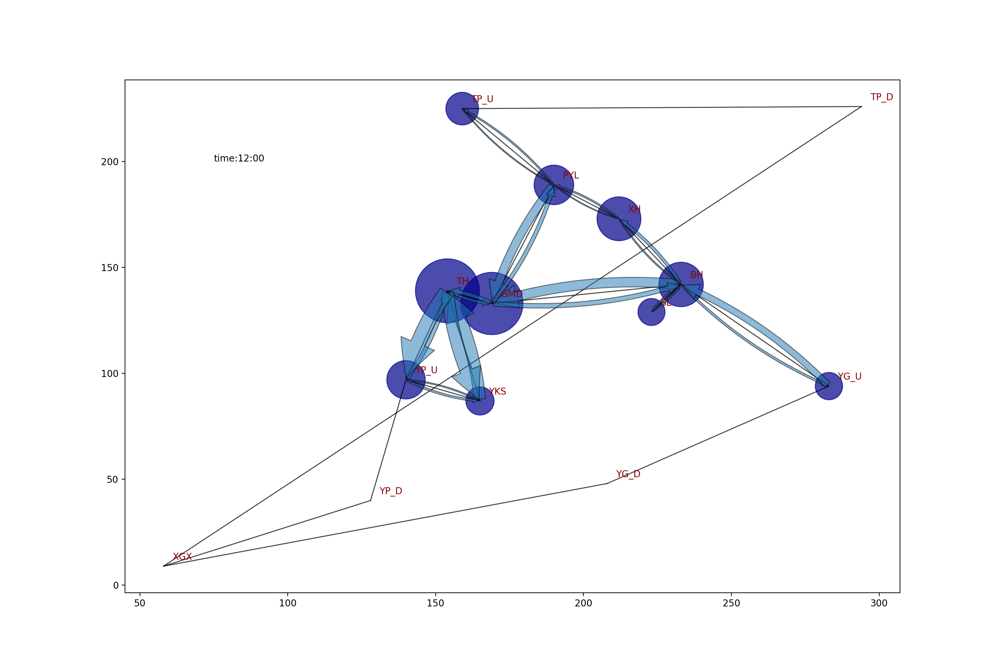

In [132]:
import numpy as np
import pandas as pd
import scipy as sp
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import scipy.stats as stats   
import scipy.cluster.vq
import datetime
import os
import matplotlib.animation as animation
%matplotlib notebook

def update(data):
    scatters.set_sizes(data[0]*15)
    tw_title.set_text('time:%s:00'%(str(data[2]//12)))
    for i in range(len(lines)):
        lines[i].set_size(data[1][i]/10)

def data_refresh():
    i = 0
    while i < 216:
        yield stayData['cnt'+str(i+72)], traceData['cnt'+str(i+72)], i+72
        i += 1

fig = plt.figure(figsize=(15,10))
gif = fig.add_subplot(111)

lines = []
for i in range(area_route.shape[0]):
    annoline = gif.annotate('',(area_route.ex[i], area_route.ey[i]),(area_route.sx[i], area_route.sy[i]),ha="right",size=20,
                            arrowprops=dict(arrowstyle='simple',alpha=0.5, connectionstyle="arc3,rad=0.1"))
    lines.append(annoline)

lines_stable = gif.plot((area_route.sx, area_route.ex),(area_route.sy, area_route.ey), c='k', linewidth=1, alpha=0.5)
scatters = gif.scatter(area_locate.x, area_locate.y, s=100, c='darkblue', linewidth=1, alpha=0.7)
tw_title = gif.text(75,200,'tw:0')

for i in range(14):
    gif.text(area_locate.x.iloc[i]+3, area_locate.y.iloc[i]+3, area_locate.area.iloc[i], color='darkred')

ani = animation.FuncAnimation(fig, update, data_refresh, interval=200)
plt.show()

C:\ProgramData\Anaconda2\lib\site-packages\ipykernel\__main__.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


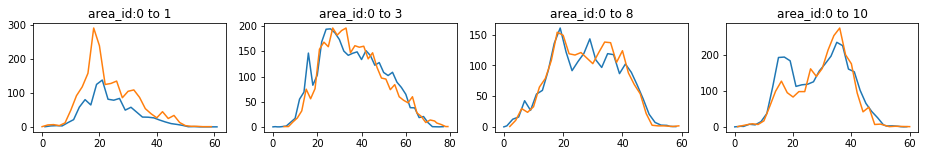

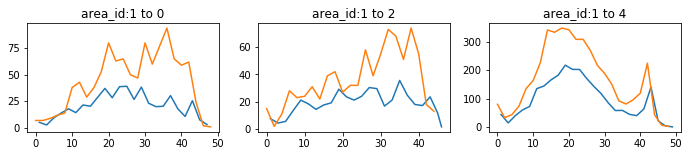

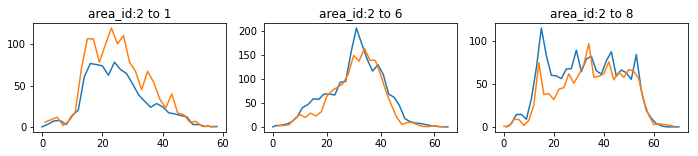

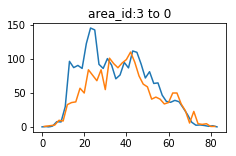

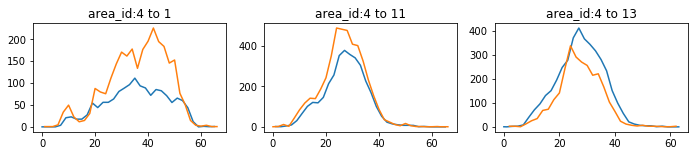

...

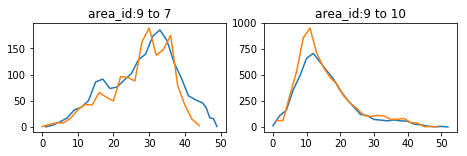

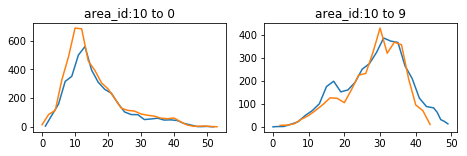

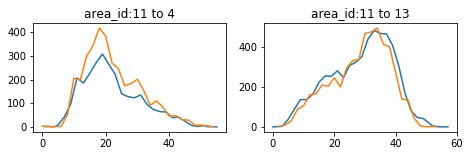

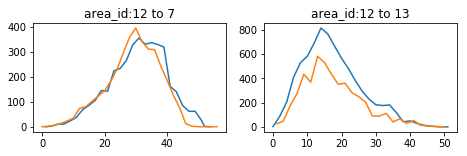

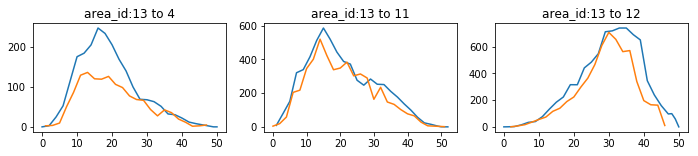

In [219]:
#绘制两点间人流随时刻的变化（半小时为单位）
def draw_tw(area_id, area_next, size = (20,10)):
    fig = plt.figure(figsize=size)
    l = len(area_next)
    for i in range(l): 
        tw_temp = trace_flow[trace_flow.area_id == area_id][trace_flow.area_next == area_next[i]]
        tw_temp.tw = tw_temp.tw // 6
        tw_temp = tw_temp.groupby(['tw', 'weekday']).apply(len).reset_index(name='cnt')
        
        ax = fig.add_subplot(l/5 + 1,5,i+1)
        ax.plot(tw_temp.cnt)
        ax.set_title('area_id:'+area_id+' to '+area_next)

for i in range(14):
    draw_tw(area_move.iloc[i,0], area_move.iloc[i,1],size=(20,2))

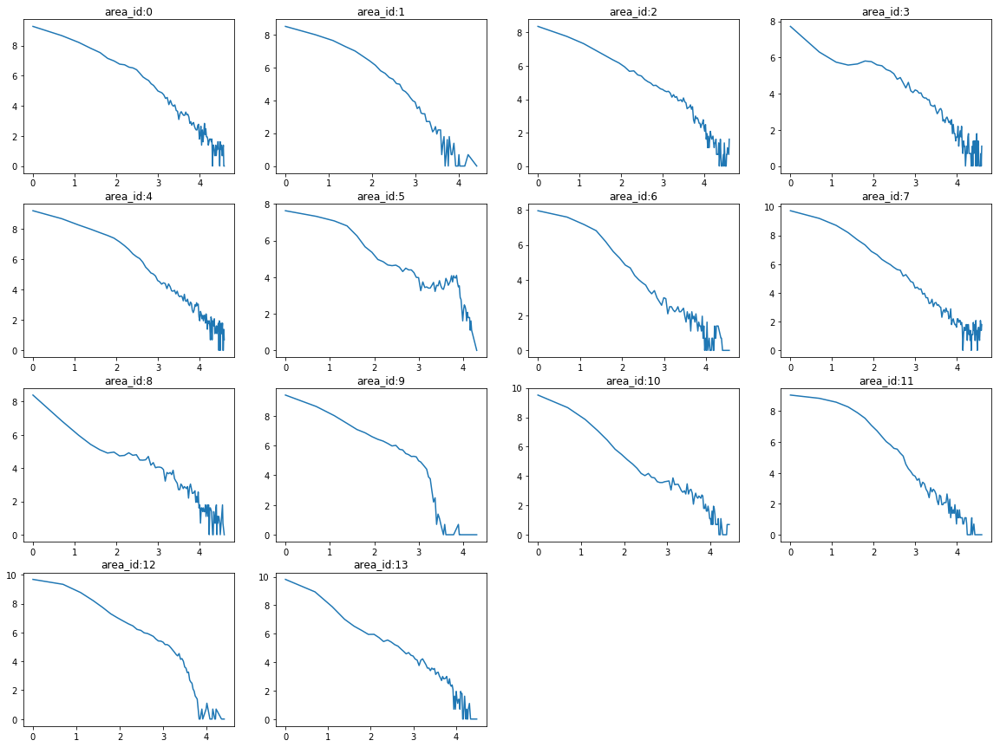

In [197]:
fig = plt.figure(figsize=(20,15))
for i in range(14):
    stay_temp = trace_flow[trace_flow.area_id == i].stay.reset_index(name='stay')
    stay_temp = stay_temp[stay_temp.stay < 100]
    stay_temp = stay_temp[stay_temp.stay > 0]
    stay_temp = stay_temp.groupby('stay').apply(len)
    ax = fig.add_subplot(14/4 + 1,4,i+1)
    ax.plot(np.log(stay_temp.index),np.log(stay_temp))
    ax.set_title('area_id:'+str(i))

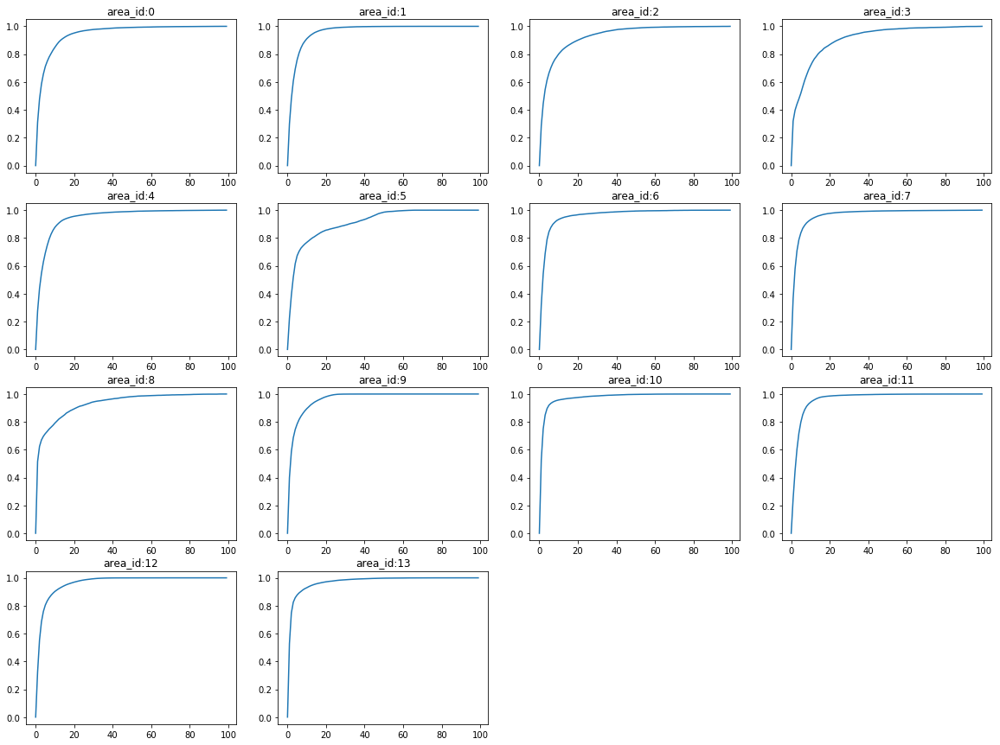

In [211]:
fig = plt.figure(figsize=(20,15))
for i in range(14):
    stay_prob = []
    stay_temp = trace_flow[trace_flow.area_id == i].stay.reset_index(name='stay')
    stay_temp = stay_temp[stay_temp.stay < 100]
    stay_temp = stay_temp[stay_temp.stay > 0].stay
    for j in range(100):
        stay_prob.append(float(len(stay_temp[stay_temp < j+1])) / len(stay_temp))
    ax = fig.add_subplot(14/4 + 1,4,i+1)
    ax.plot(np.array(stay_prob))
    ax.set_title('area_id:'+str(i))

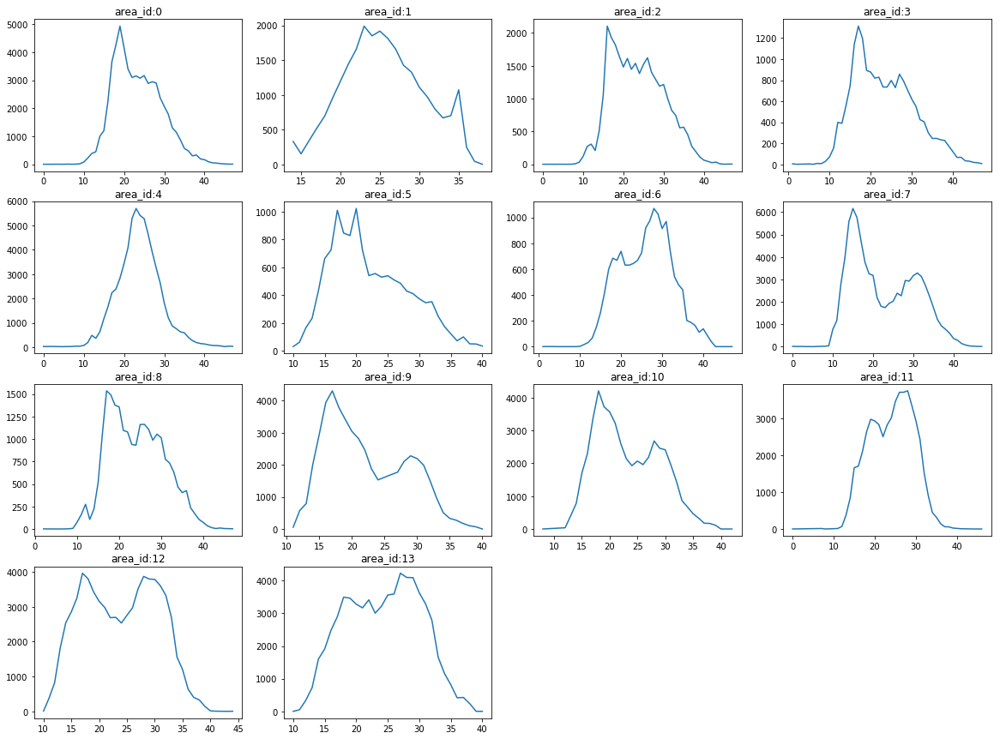

In [195]:
fig = plt.figure(figsize=(20,15))
for i in range(14):
    move_temp = trace_flow[trace_flow.area_id == i]
    move_temp.tw = move_temp.tw // 6
    move_temp = move_temp.groupby('tw').apply(len).reset_index(name='cnt')
    ax = fig.add_subplot(14/4 + 1,4,i+1)
    ax.plot(move_temp.tw, move_temp.cnt)
    ax.set_title('area_id:'+str(i))